In [1]:
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline
import pandas as pd
from rubin_sim.maf import radar
import os

from matplotlib.legend_handler import HandlerErrorbar

In [2]:
def norm_df(
    df,
    runs,
    cols,
    norm_run="baseline",
    invert_cols=None,
    reverse_cols=None,
    run_label="run_name",
    mag_cols=[],
):
    """
    Normalize values in a dataframe to a given run
    Parameters
    ----------
    df : pandas.DataFrame
        The input data frame
    runs : list of str
        A list of run numes
    cols : list of str
        A list of columns in df to use
    norm_run : str
        The row to use to normalize things to
    invert_cols : list of str
        A list of column names that should be inverted (e.g., columns that
        are uncertainties and are better with a smaller value)
    reverse_cols : list of str
        Columns to reverse (e.g., magnitudes)
    run_label : str (run_name)
        The column that has run names
    mag_cols : list of str
        Columns that are in magnitudes
    """
    indices = [np.max(np.where(df.index == name)[0]) for name in runs]
    out_df = df[cols].iloc[indices].copy()
    if reverse_cols is not None:
        for colname in reverse_cols:
            out_df[colname] = -out_df[colname]
    if invert_cols is not None:
        for colname in invert_cols:
            out_df[colname] = 1.0 / out_df[colname]
    if norm_run is not None:
        indx = np.max(np.where(out_df.index == norm_run)[0])
        for col in out_df.columns:
            # maybe just check that it's not a
            if col != "run_name":
                if (col in mag_cols) | (mag_cols == "all"):
                    out_df[col] = 1.0 + (out_df[col] - out_df[col].iloc[indx])
                else:
                    out_df[col] = (
                        1.0
                        + (out_df[col] - out_df[col].iloc[indx])
                        / out_df[col].iloc[indx]
                    )
    return out_df

In [3]:

data_loaded = pd.read_hdf('summary.h5')
data_loaded.shape

(185, 187123)

In [4]:
#[col for col in data_loaded.columns if 'LVDwarfs' in col]
#[col for col in data_loaded.columns if 'KNePop' in col and 'Total detected' in col and 'ztfrest_simple ' in col and 'DD' in col ]#
# [col for col in data_loaded.columns if 'Footprint' in col ]

In [5]:
# Pull out the metrics we are interested in and define simple names

name_dict = {'FootprintFraction N year 1 u and night < 365 HealpixSlicer': 'Y1,u',
            'FootprintFraction N year 1 g and night < 365 HealpixSlicer': 'Y1,g',
            'FootprintFraction N year 1 r and night < 365 HealpixSlicer': 'Y1,r',

            'FootprintFraction N year 1 i and night < 365 HealpixSlicer': 'Y1,i',
    'best18k Parallax fiveSigmaDepth, filter, seeingFwhmGeom, ra_pi_amp, dec_pi_amp HealpixSlicer': 'parallax best 18k',
            'best18k properMotion HealpixSlicer': 'proper motion best 18k',
            'Fraction detected of total (mean) MicrolensingMetric_detect tE 20_30 days UserPointsSlicer': '20-30d microlensing\ndetection',
            'Fraction detected of total (mean) MicrolensingMetric_detect tE 60_90 days UserPointsSlicer': '60-90d microlensing\ndetection',
            'fONv MedianNvis fO HealpixSlicer': 'fO N vis',
            'Total detected SNNSNMetric_reducen_sn DDF excluded HealpixSlicer': 'SNe, N',
             'Median SNNSNMetric_reducezlim DDF excluded HealpixSlicer': 'SNe, zlim',
            '3x2ptFoM Exgalm5WithCuts i band non-DD year 10 HealpixSlicer': '3x2 i-band',
            'Median WeakLensingNvisits gri band non-DD HealpixSlicer': 'WL Nvis \ni-band',
            'Total detected KNePopMetric_all_ztfrest_simple all models UserPointsSlicer': 'KNe ZTF simple',
            'Total detected KNePopMetric_single_ztfrest_simple single model UserPointsSlicer': 'KNe single model',
            #'Sum PrestoKNe_score_p UserPointsSlicer': 'KNe Score, P',
            'Total detected XRBPopMetric_early_detect UserPointsSlicer': 'XRB\nearly detect',
            'VolumeSum Brown Dwarf, L7 HealpixSlicer': 'Brown Dwarf Vol',
            'CumulativeCompleteness H <= 16.000000 DiscoveryNChances NEO 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'NEO bright',
            'CumulativeCompleteness H <= 22.000000 DiscoveryNChances NEO 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'NEO faint',
            'CumulativeCompleteness H <= 6.000000 DiscoveryNChances TNO 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'TNO',
            'CumulativeCompleteness H <= 20.000000 DiscoveryNChances MBA 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'MBA',
            'CumulativeCompleteness H <= 18.000000 DiscoveryNChances Trojan 3 pairs in 15 nights SNR=3 detection loss MoObjSlicer': 'Trojan',
            'CumulativeCompleteness H <= 16.000000 DiscoveryNChances Vatira 1 quad in 1 night detection loss MoObjSlicer': 'Vatira',
            'CumulativeCompleteness H <= 20.000000 DiscoveryNChances PHA 1 quad in 1 night detection loss MoObjSlicer': 'PHA, quad'}
            
# drop in the units for the columns
units = {'parallax best 18k': 'mas',
         'proper motion best 18k': 'mas/yr',
         '20-30d microlensing\ndetection': 'fraction', 
         '60-90d microlensing\ndetection': 'fraction', 
         'fO N vis' : '', 
         'SNe, N': '', 
         'SNe, zlim': '', 
         '3x2 i-band': 'score', 
         'WL Nvis \ni-band': '', 
         'KNe ZTF simple': 'N', 
         'KNe single model': 'N',
         'KNe Score, P': 'score',
         'XRB\nearly detect': 'N', 
         'Brown Dwarf Vol': 'pc^3', 
         'NEO bright': 'fraction', 
         'NEO faint': 'fraction', 
         'TNO': 'fraction', 
         'MBA':'fraction',
         'Trojan': 'fraction',
         'Vatira': 'fraction',
         'PHA, quad': 'fraction',
         'Y1,u': '',
         'Y1,g': '',
         'Y1,r': '',
         'Y1,i': '',
        }

# If columns are uncertainties, we want to plot them backwards
invert_cols = ['parallax best 18k', 'proper motion best 18k']
# If columns are mags or fractions, we want to plot differences, not fractional differences.
mag_cols = ['20-30d microlensing\ndetection', '60-90d microlensing\ndetection','SNe, zlim',
            'NEO bright', 'NEO faint', 'TNO', 'Vatira', 'MBA', 'Trojan',
           'u', 'g', 'r', 'i', 'z', 'y']

data = pd.DataFrame()
for key in name_dict:
    data[name_dict[key]] = data_loaded[key]
    

mag_dict = {'Median CoaddM5 g HealpixSlicer': 'g',
 'Median CoaddM5 i HealpixSlicer': 'i',
 'Median CoaddM5 r HealpixSlicer': 'r',
 'Median CoaddM5 u HealpixSlicer': 'u',
 'Median CoaddM5 y HealpixSlicer': 'y',
 'Median CoaddM5 z HealpixSlicer': 'z'}

mag_data = pd.DataFrame()
for key in mag_dict:
    mag_data[mag_dict[key]] = data_loaded[key]
    
    
    
ddf_dict = {'Sum SNNSNMetric DD:COSMOS_reducen_sn DD:COSMOS all bands, only DDF observations HealpixSubsetSlicer' : 'N SN COSMOS',
           'Sum SNNSNMetric DD:ECDFS_reducen_sn DD:ECDFS all bands, only DDF observations HealpixSubsetSlicer' : 'N SN ECDFS',
           'Sum SNNSNMetric DD:EDFS_reducen_sn DD:EDFS all bands, only DDF observations HealpixSubsetSlicer' : 'N SN EDFS',
           'Sum SNNSNMetric DD:ELAISS1_reducen_sn DD:ELAISS1 all bands, only DDF observations HealpixSubsetSlicer' : 'N SN ELAISS1',
           'Sum SNNSNMetric DD:XMM_LSS_reducen_sn DD:XMM_LSS all bands, only DDF observations HealpixSubsetSlicer' : 'N SN XMM_LSS',
            
           'Median SNNSNMetric DD:COSMOS_reducezlim DD:COSMOS all bands, only DDF observations HealpixSubsetSlicer': 'zlim COSMOS',
            'Median SNNSNMetric DD:ECDFS_reducezlim DD:ECDFS all bands, only DDF observations HealpixSubsetSlicer': 'zlim ECDFS',
            'Median SNNSNMetric DD:EDFS_reducezlim DD:EDFS all bands, only DDF observations HealpixSubsetSlicer': 'zlim EDFS',
            'Median SNNSNMetric DD:ELAISS1_reducezlim DD:ELAISS1 all bands, only DDF observations HealpixSubsetSlicer': 'zlim ELAISS1',
            'Median SNNSNMetric DD:XMM_LSS_reducezlim DD:XMM_LSS all bands, only DDF observations HealpixSubsetSlicer': 'zlim XMM_LSS',
            
           'Total detected KNePopMetric_DD:COSMOS_ztfrest_simple DD:COSMOS UserPointsSlicer': 'Kne COSMOS',
         'Total detected KNePopMetric_DD:ECDFS_ztfrest_simple DD:ECDFS UserPointsSlicer': 'Kne ECDFS',
 'Total detected KNePopMetric_DD:EDFS_ztfrest_simple DD:EDFS UserPointsSlicer': 'Kne EDFS',
 'Total detected KNePopMetric_DD:ELAISS1_ztfrest_simple DD:ELAISS1 UserPointsSlicer': 'Kne ELAISS1',
 'Total detected KNePopMetric_DD:WFD_ztfrest_simple DD:WFD UserPointsSlicer': 'Kne WFD',
 'Total detected KNePopMetric_DD:XMM_LSS_ztfrest_simple DD:XMM_LSS UserPointsSlicer': 'Kne XMM_LSS',
            
            'Median DD:COSMOS NVisits all bands HealpixSubsetSlicer':'N COSMOS',
 'Median DD:ECDFS NVisits all bands HealpixSubsetSlicer': 'N ECDFS',
 'Median DD:EDFS NVisits all bands HealpixSubsetSlicer': 'N EDFS',
 'Median DD:ELAISS1 NVisits all bands HealpixSubsetSlicer': 'N ELAISS1',
 'Median DD:WFD NVisits all bands HealpixSubsetSlicer': 'N WFD',
 'Median DD:XMM_LSS NVisits all bands HealpixSubsetSlicer': 'N XMM_LSS', 
           }

ddf_data = pd.DataFrame()
for key in ddf_dict:
    ddf_data[ddf_dict[key]] = data_loaded[key]
 
gaps_dict = {}
for filtername in 'ugrizy':
    for times in [3,7,24]:
        gaps_dict['Mean N gaps in %s at %ihr in top 18k Gaps_%ihr %s band HealpixSlicer'% (filtername, times, times, filtername)] = 'gaps %s %i' % (filtername, times)
        #gaps_dict['Mean Gaps_%ihr %s band HealpixSlicer' % (times, filtername)] = 'gaps %s %i' % (filtername, times)
        
gaps_data = pd.DataFrame()
for key in gaps_dict:
    gaps_data[gaps_dict[key]] = data_loaded[key]

In [6]:
#data['KNe single model'] # data['KNe ZTF simple']

In [7]:
# A bit of a mystery why baseline_v3.0_10yrs is so much better. 
# The KNe ZTF simple and KNe single model don't seem to
# be particularly well correlated. Seems like it has to be an MJD_start bug somewhere, but I can't find it.
#data['KNe ZTF simple']

In [8]:
mag_data

,g,i,r,u,y,z
baseline_v2.0_10yrs,26.733479,26.218659,26.755971,25.818916,24.762720,25.510379
baseline_v2.1_10yrs,26.736248,26.252054,26.781543,25.751969,24.728145,25.486640
baseline_v2.2_10yrs,26.753646,26.290929,26.835430,25.724699,24.782743,25.581317
baseline_v3.0_10yrs,26.688123,26.264600,26.818287,25.668262,24.756955,25.524781
baseline_v3.2_10yrs,26.678103,26.295888,26.807880,25.622696,24.766647,25.586860
...,...,...,...,...,...,...
weather_cloudso35v3.4_10yrs,26.765863,26.461740,26.936502,25.311023,24.801142,25.752581
weather_cloudso36v3.4_10yrs,26.782824,26.458285,26.939210,25.320909,24.804274,25.760733
weather_cloudso4v3.4_10yrs,26.823834,26.479794,26.976399,25.365712,24.823256,25.770120
weather_cloudso6v3.4_10yrs,26.821514,26.491849,26.973728,25.364518,24.837915,25.780059


In [9]:
ddf_data
#ddf_data = ddf_data.reindex(new_ind)

,N SN COSMOS,N SN ECDFS,N SN EDFS,N SN ELAISS1,N SN XMM_LSS,zlim COSMOS,zlim ECDFS,zlim EDFS,zlim ELAISS1,zlim XMM_LSS,...,Kne EDFS,Kne ELAISS1,Kne WFD,Kne XMM_LSS,N COSMOS,N ECDFS,N EDFS,N ELAISS1,N WFD,N XMM_LSS
baseline_v2.0_10yrs,638.253284,586.826209,974.231557,684.401547,611.229060,0.503926,0.485978,0.481621,0.508870,0.490990,...,365.0,423.0,298.0,317.0,8937.5,9264.0,5497.0,9262.0,833.0,9024.0
baseline_v2.1_10yrs,548.479625,545.669910,875.981802,636.634918,520.071105,0.496150,0.484905,0.474738,0.501027,0.480094,...,373.0,384.0,289.0,325.0,8900.0,9166.5,5506.0,9127.0,820.0,8941.0
baseline_v2.2_10yrs,708.239238,685.202422,1067.553931,674.561648,611.247120,0.493897,0.495572,0.466223,0.488264,0.484132,...,425.0,370.0,327.0,304.0,9853.0,9663.0,6150.0,9991.0,829.0,9869.0
baseline_v3.0_10yrs,955.159293,799.584601,1266.961769,688.808879,726.491723,0.503734,0.521961,0.464010,0.500330,0.484669,...,428.0,405.0,339.0,340.0,18716.5,10606.5,6668.0,10671.0,817.0,10845.0
baseline_v3.2_10yrs,971.481238,868.593513,1528.851192,844.740564,840.405268,0.510969,0.550142,0.486932,0.516296,0.502590,...,537.0,455.0,392.0,419.0,19496.5,10806.5,6800.0,10295.0,861.0,10714.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
weather_cloudso35v3.4_10yrs,931.201159,809.597913,1379.044260,777.300267,734.947313,0.548710,0.535488,0.496629,0.510424,0.497228,...,572.0,479.0,423.0,417.0,19240.5,9827.0,6115.0,9723.0,908.0,9586.0
weather_cloudso36v3.4_10yrs,971.367562,773.848626,1391.251789,827.270250,832.244000,0.550022,0.544726,0.502587,0.489120,0.505490,...,537.0,503.0,416.0,435.0,19501.0,9520.5,5864.0,9921.0,918.0,9905.0
weather_cloudso4v3.4_10yrs,999.605374,851.867808,1640.412837,855.877115,930.847858,0.537376,0.559896,0.512214,0.515553,0.518643,...,609.0,524.0,449.0,468.0,19240.5,10418.0,6539.0,10001.0,924.0,10166.0
weather_cloudso6v3.4_10yrs,999.888886,871.682608,1701.222170,898.212537,929.571852,0.546925,0.562375,0.508507,0.522198,0.504127,...,671.0,540.0,447.0,488.0,19865.5,10121.0,6553.0,10232.0,931.0,10511.0


In [10]:
gaps_data

,gaps u 3,gaps u 7,gaps u 24,gaps g 3,gaps g 7,gaps g 24,gaps r 3,gaps r 7,gaps r 24,gaps i 3,gaps i 7,gaps i 24,gaps z 3,gaps z 7,gaps z 24,gaps y 3,gaps y 7,gaps y 24
baseline_v2.0_10yrs,0.559565,0.096983,2.681121,0.501515,0.060381,4.151443,2.579755,0.452371,17.055252,2.086213,0.422810,15.289504,2.832937,0.465706,18.134005,2.181890,0.218119,10.919662
baseline_v2.1_10yrs,0.601110,0.097077,2.961440,0.621392,0.080291,4.104024,2.708024,0.389565,18.103231,2.217187,0.366019,16.026064,3.008206,0.484776,18.327179,2.477409,0.206229,10.257798
baseline_v2.2_10yrs,0.633655,0.187066,3.622465,0.399776,0.051569,4.466172,1.834849,0.314636,19.672775,1.433580,0.276449,16.984520,2.238075,0.408775,20.773395,1.377629,0.186833,8.640323
baseline_v3.0_10yrs,0.257192,0.257425,3.984706,0.213736,0.363687,3.787056,1.069054,1.779876,20.989882,1.293328,1.973516,18.047932,1.569590,1.366578,22.387886,0.725976,0.211312,9.392083
baseline_v3.2_10yrs,0.140020,0.100247,3.084814,0.605912,0.540215,3.727001,1.198583,0.843055,20.776752,2.040891,1.196717,19.389239,1.162540,0.734229,16.713013,1.363501,0.541941,13.219471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
weather_cloudso35v3.4_10yrs,0.184455,0.101366,4.178393,0.200214,0.127617,4.756609,1.779736,1.525202,25.156292,1.703269,1.066023,21.343778,1.225020,0.806873,19.403087,1.471068,0.617616,16.143983
weather_cloudso36v3.4_10yrs,0.211498,0.118851,3.977713,0.198116,0.152889,4.558959,1.885485,1.503847,25.169907,1.534527,0.999067,21.828041,1.119690,0.803516,19.293794,1.410967,0.581200,16.243717
weather_cloudso4v3.4_10yrs,0.195692,0.122488,3.865342,0.212011,0.163613,4.511773,1.980230,1.521378,25.140859,1.616030,0.850329,21.654404,1.192847,0.779550,19.186739,1.470975,0.610202,16.145568
weather_cloudso6v3.4_10yrs,0.187066,0.117825,4.292488,0.187066,0.148366,4.941064,1.819089,1.489253,26.936355,1.793957,1.107801,22.493262,1.402993,1.002798,20.438663,1.598219,0.646431,17.482585


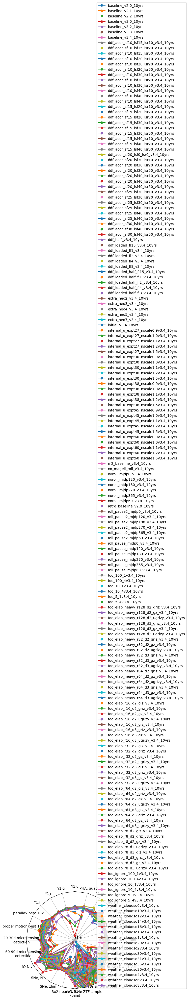

In [11]:
runs = [run for run in data.index ]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.8, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

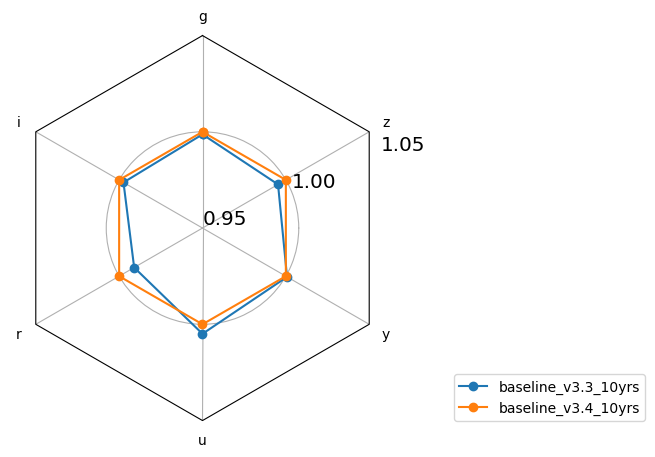

In [12]:
runs = ['baseline_v3.3_10yrs', 'baseline_v3.4_10yrs' ]
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

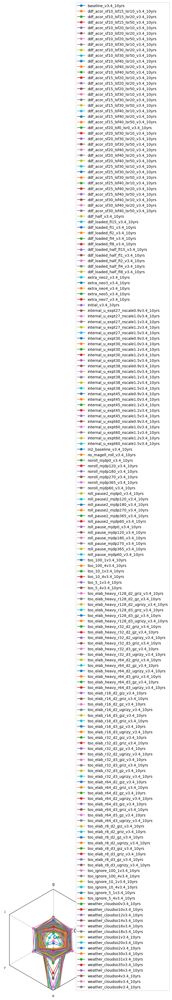

In [13]:
runs = [ run for run in data.index if '3.4' in run]
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='initial_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.90, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

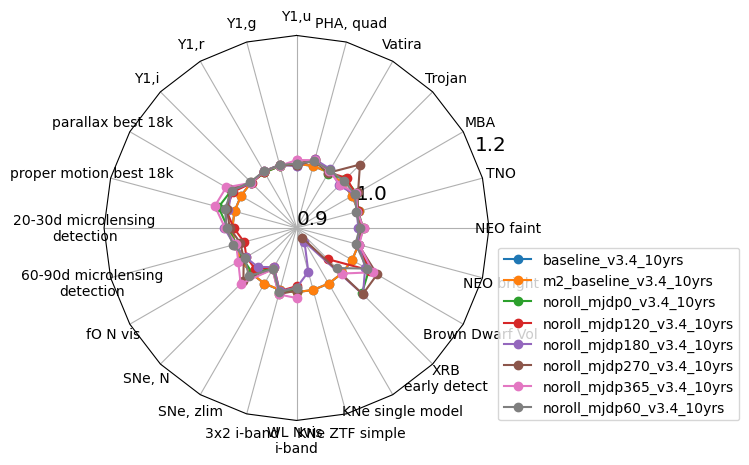

In [14]:
runs = [run for run in data.index if 'baseline_v3.4' in run or 'noroll' in run]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

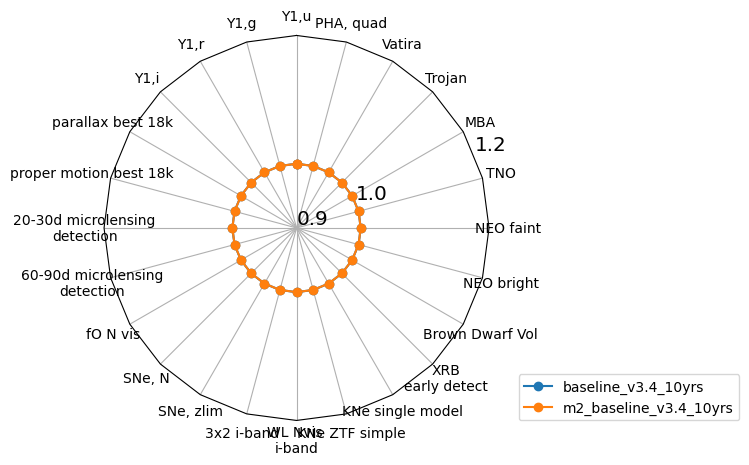

In [15]:
# Look at difference between cluster and Apple chips
runs = ['baseline_v3.4_10yrs', 'm2_baseline_v3.4_10yrs' ]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

In [16]:
# One snap
#runs = ['baseline_v3.4_10yrs', 'onesnap_v3.4_10yrs' ]
#ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
#                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
#fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

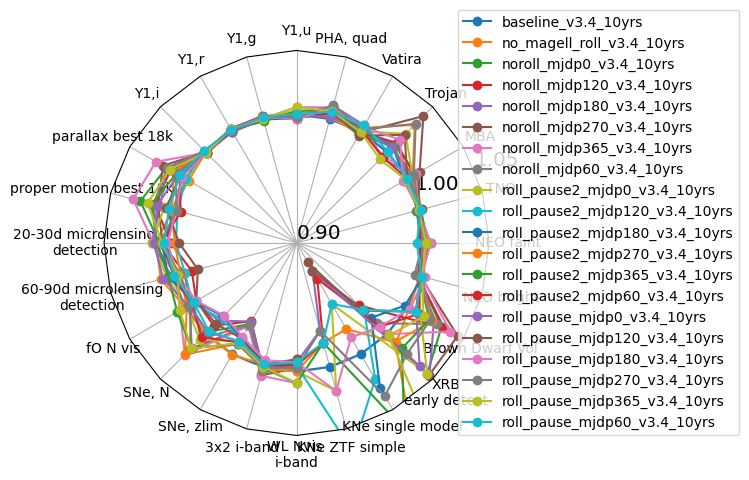

In [17]:
# various rolling
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'roll' in run]
ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.90, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

In [18]:


times = ['retro_baseline_v2.0_10yrs', 'baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs',
        'baseline_v3.0_10yrs',  'baseline_v3.2_10yrs', 'baseline_v3.3_10yrs', 'baseline_v3.4_10yrs']

sub_data = data.reindex(labels=times)
sub_ddf = ddf_data.reindex(labels=times)
sub_mag = mag_data.reindex(labels=times)
sub_gaps = gaps_data.reindex(labels=times)
sub_data



,"Y1,u","Y1,g","Y1,r","Y1,i",parallax best 18k,proper motion best 18k,20-30d microlensing\ndetection,60-90d microlensing\ndetection,fO N vis,"SNe, N",...,KNe single model,XRB\nearly detect,Brown Dwarf Vol,NEO bright,NEO faint,TNO,MBA,Trojan,Vatira,"PHA, quad"
retro_baseline_v2.0_10yrs,0.893276,0.949104,0.960964,0.958616,0.804328,0.176701,0.0878,0.1568,848.0,97124.012102,...,89.0,724.0,179640.718155,0.9048,0.624144,0.705922,0.943673,0.667514,0.0000,0.847855
baseline_v2.0_10yrs,0.955776,0.981594,0.994441,0.997035,0.791058,0.184088,0.3119,0.4348,839.0,99302.532220,...,108.0,1868.0,168086.074111,0.9294,0.642165,0.719712,0.919119,0.588234,0.0039,0.859388
baseline_v2.1_10yrs,0.948661,0.984188,0.996912,0.999012,0.806910,0.188258,0.3141,0.4319,838.0,99294.339899,...,82.0,1885.0,163815.013503,0.9286,0.647818,0.723396,0.927584,0.609144,0.0017,0.865595
baseline_v2.2_10yrs,0.871233,0.914268,0.993947,0.998023,0.792958,0.186345,0.3268,0.4487,830.0,112802.099640,...,106.0,1919.0,172453.127988,0.9304,0.657736,0.723964,0.933674,0.615614,0.0008,0.858646
baseline_v3.0_10yrs,0.813058,0.901174,0.993823,0.999135,0.792666,0.185683,0.3232,0.4528,795.0,109475.798536,...,118.0,1924.0,168032.537231,0.9326,0.642444,0.722371,0.924274,0.611475,0.0376,0.888025
baseline_v3.2_10yrs,0.973633,0.982335,0.996170,0.995800,0.782518,0.185369,0.3437,0.4869,805.0,123176.659086,...,112.0,2032.0,174053.517478,0.9460,0.642240,0.720853,0.926557,0.589189,0.4628,0.893770
baseline_v3.3_10yrs,0.987305,0.992712,0.997529,0.996294,0.753823,0.179042,0.3817,0.5233,811.0,152910.228661,...,122.0,2080.0,188222.084374,0.9442,0.659856,0.722551,0.942687,0.630071,0.4606,0.906586
baseline_v3.4_10yrs,0.981306,0.990364,0.995553,0.997529,0.752625,0.177617,0.3653,0.5179,817.0,151098.440513,...,133.0,2045.0,188726.163395,0.9478,0.667858,0.727785,0.943605,0.634531,0.4634,0.904225


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_50796/3763499284.py:26: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_data[col].values.size), sub_data[col], yerr=std_dict[col], fmt='s', color='k',


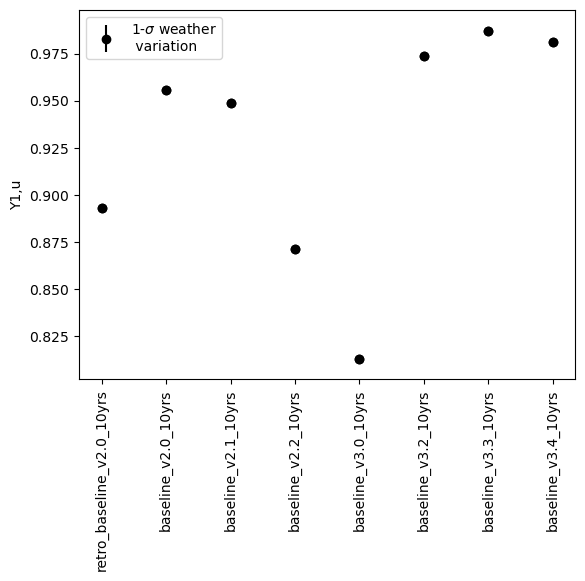

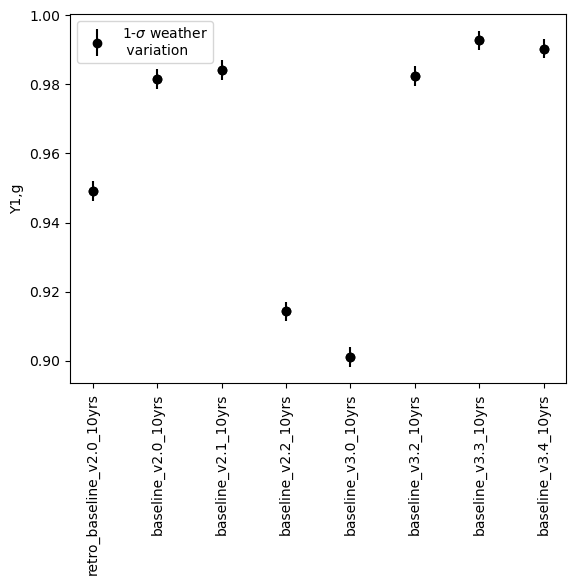

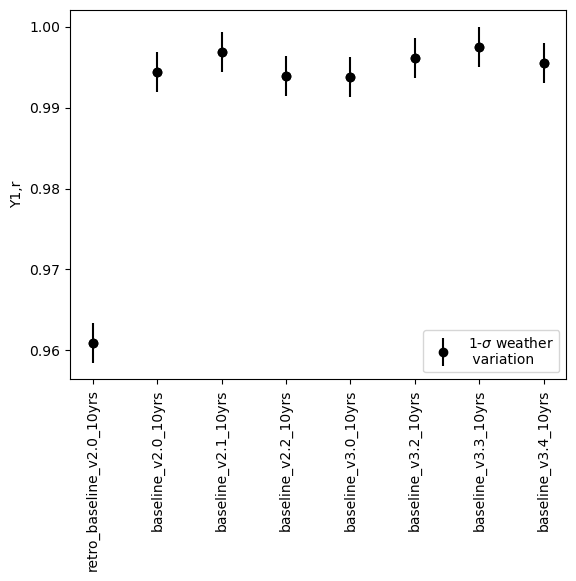

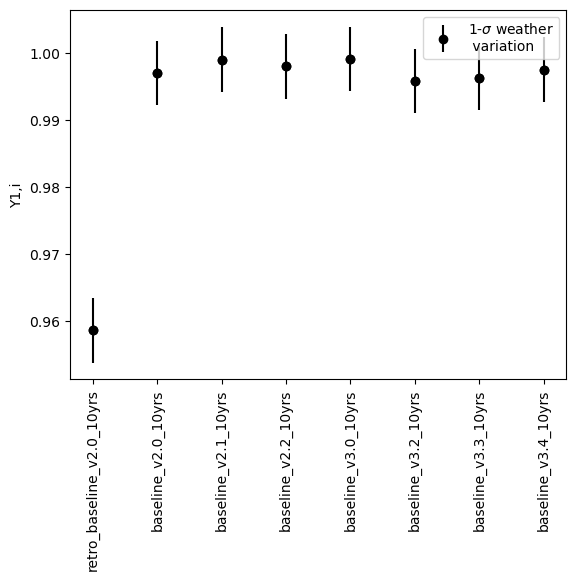

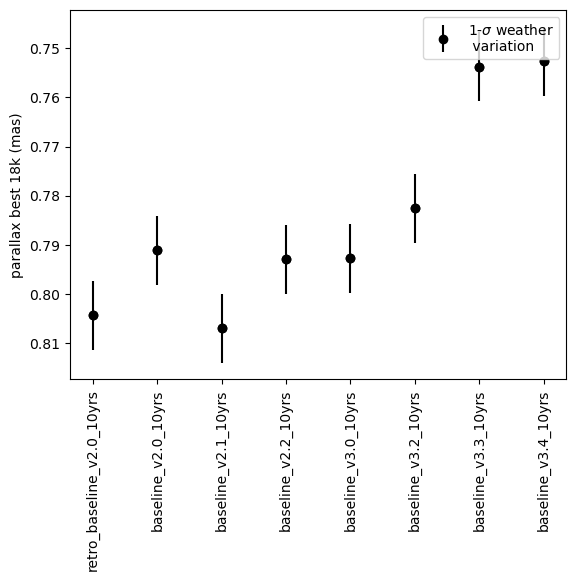

...

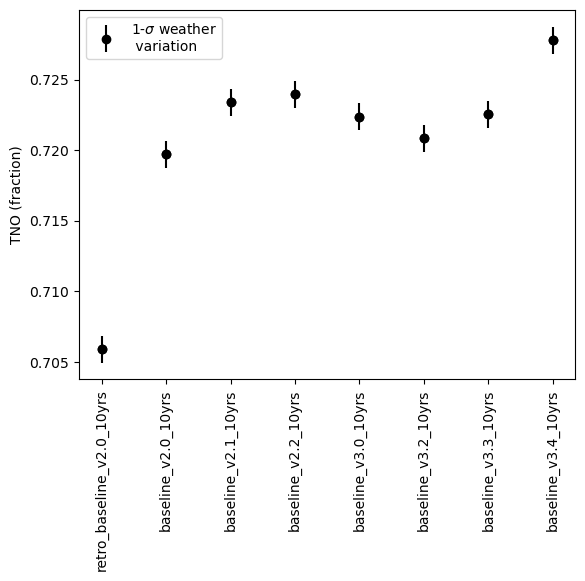

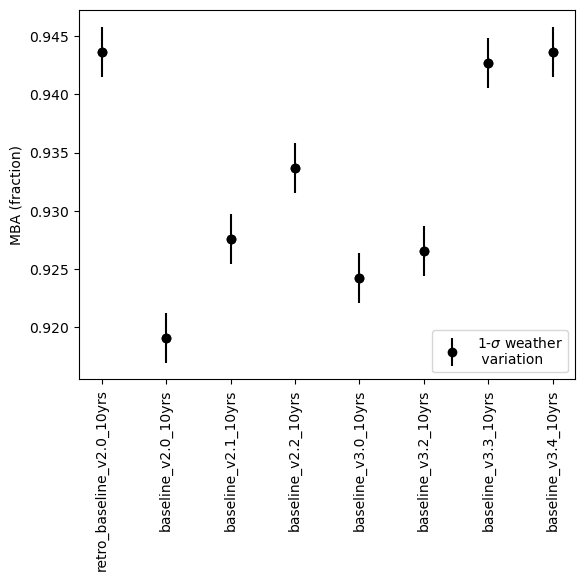

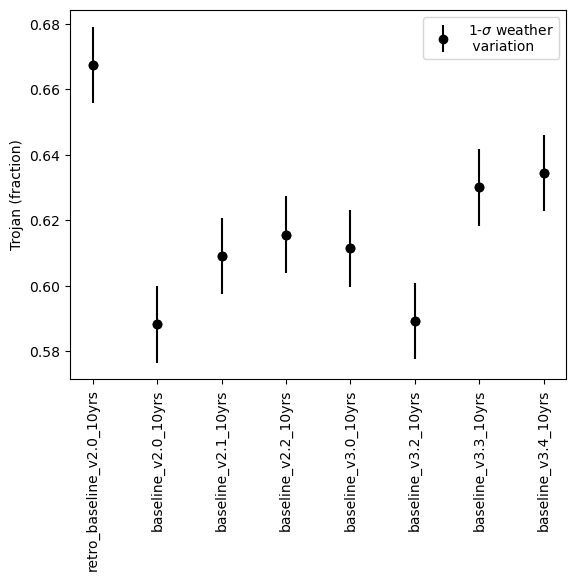

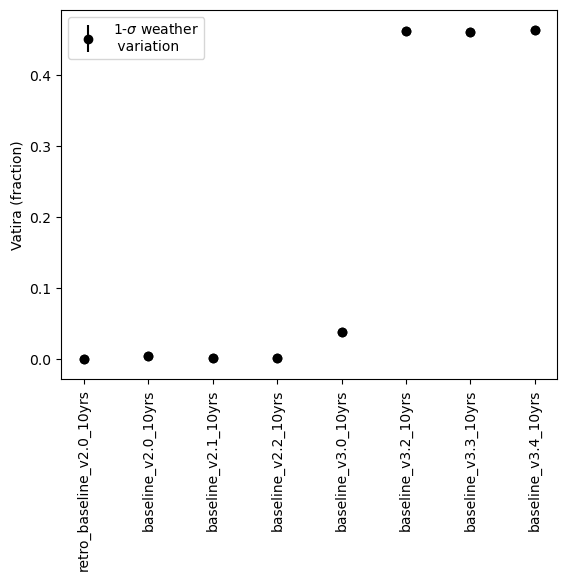

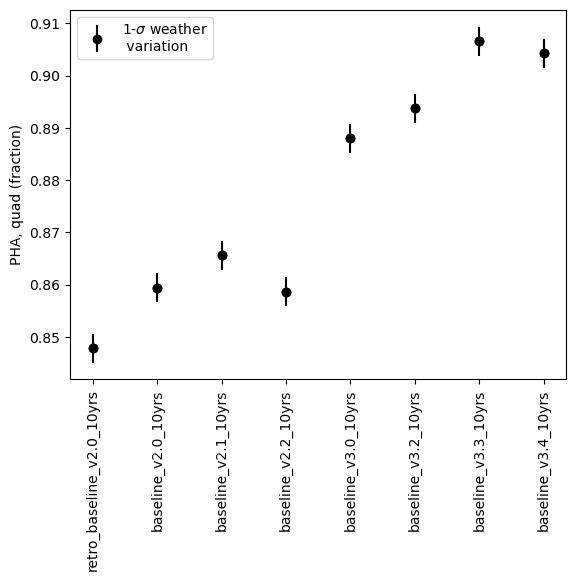

In [19]:
# Rough error bars from weather simulations
std_dict = {}
weather_runs = [run for run in data.index if 'weather' in run]
for col in data.columns:
    std_dict[col] = np.std(data.loc[weather_runs][col])

std_mag_dict = {}
for col in mag_data.columns:
    std_mag_dict[col] = np.std(mag_data.loc[weather_runs][col])
    
std_ddf_dict = {}
for col in ddf_data.columns:
    std_ddf_dict[col] = np.std(ddf_data.loc[weather_runs][col])
 

std_gaps_dict = {}
for col in gaps_data.columns:
    std_gaps_dict[col] = np.std(gaps_data.loc[weather_runs][col])


#col = data.columns[0]
for col in sub_data.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_data[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_data[col].values.size), sub_data[col], yerr=std_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ weather'
                '\n variation', marker='o')
    if units[col] != '':
        label_add = ' (' + units[col]+')'
    ax.set_ylabel(col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_50796/1292493311.py:5: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_gaps_dict[col], fmt='s', color='k',


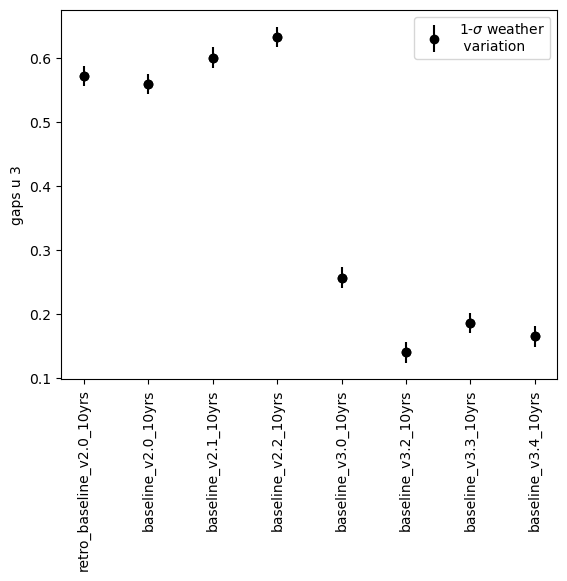

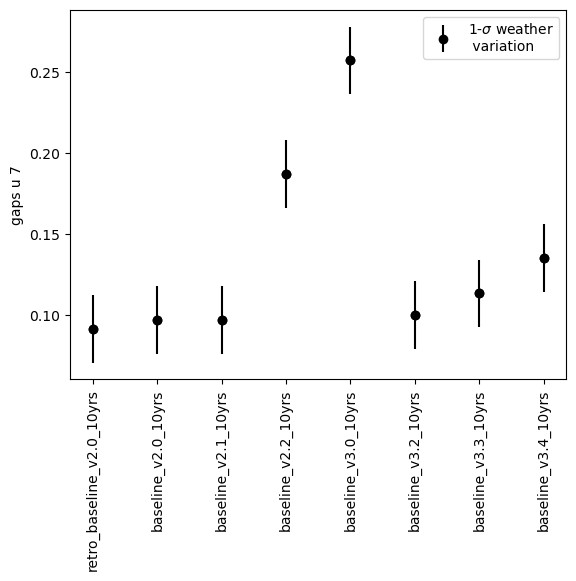

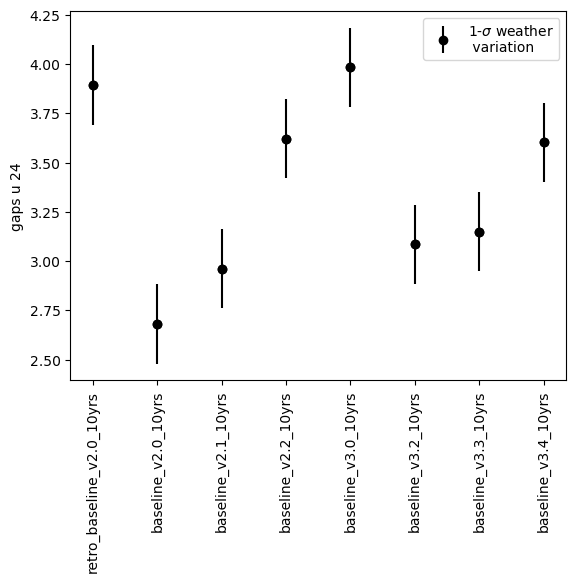

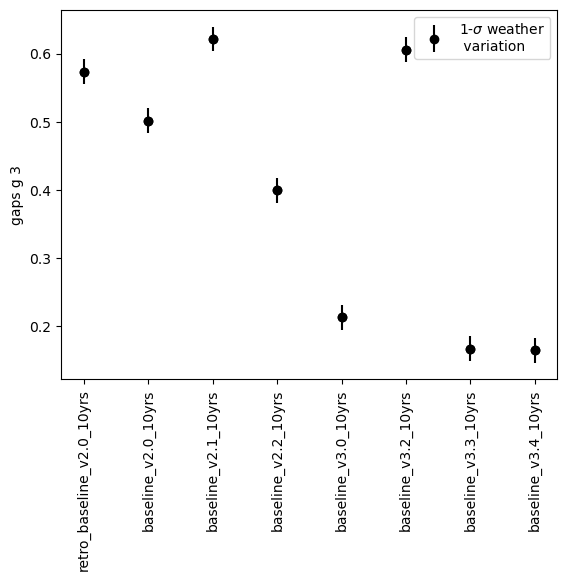

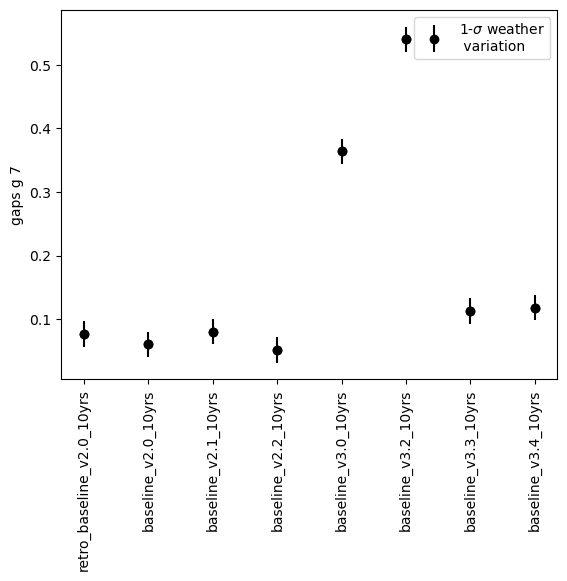

...

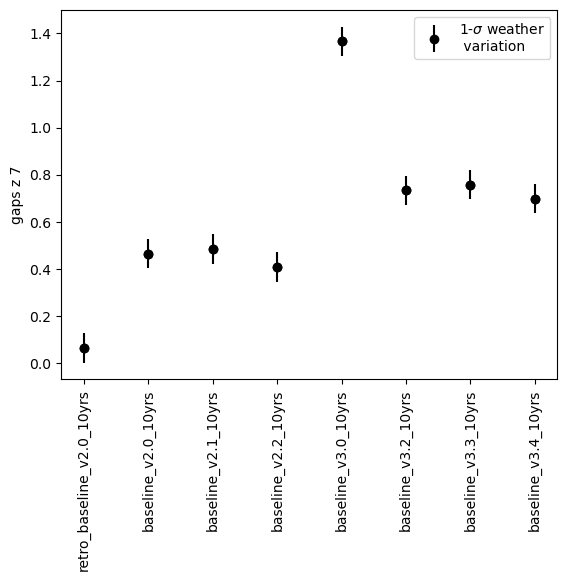

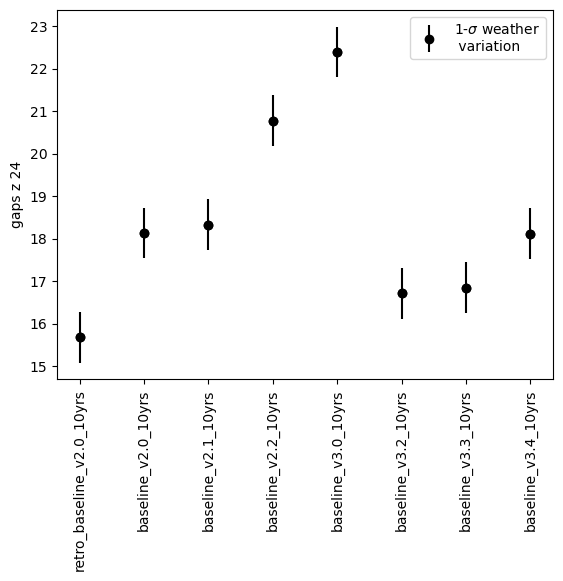

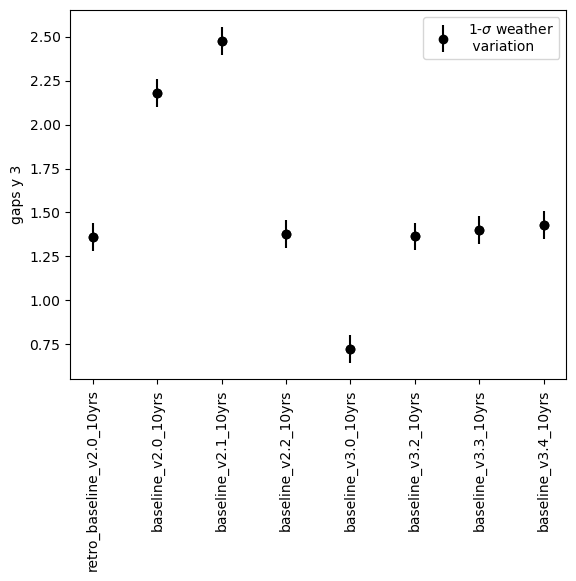

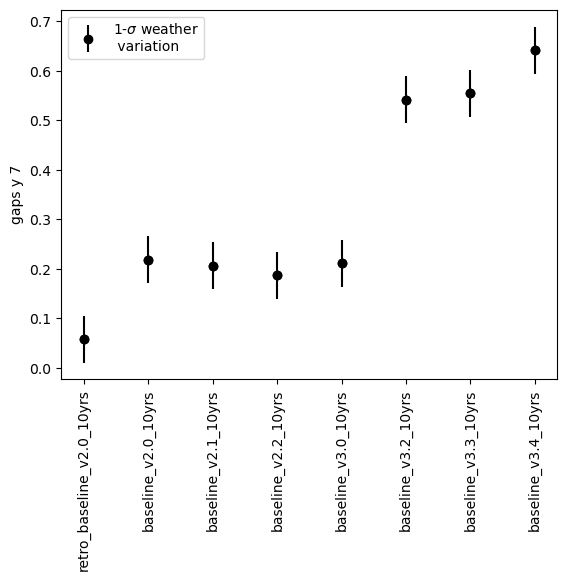

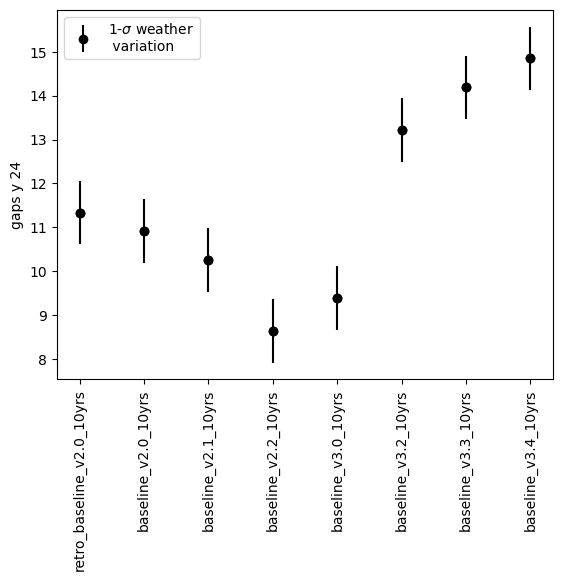

In [20]:
for col in sub_gaps.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_gaps[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_gaps_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ weather'
                '\n variation', marker='o')
    #if units[col] != '':
    #    label_add = ' (' + units[col]+')'
    ax.set_ylabel(col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_50796/3981456560.py:23: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_ddf_dict[col], fmt='s', color='k',


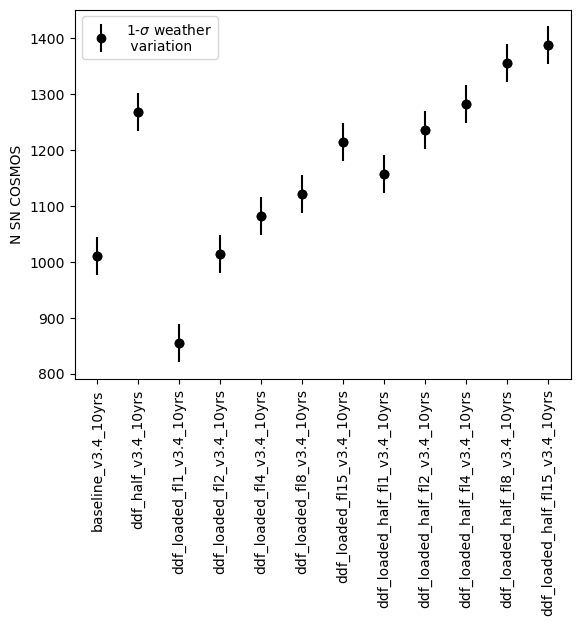

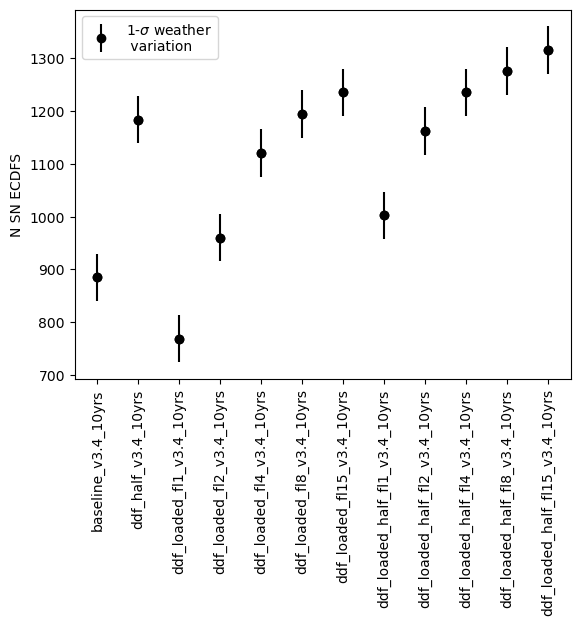

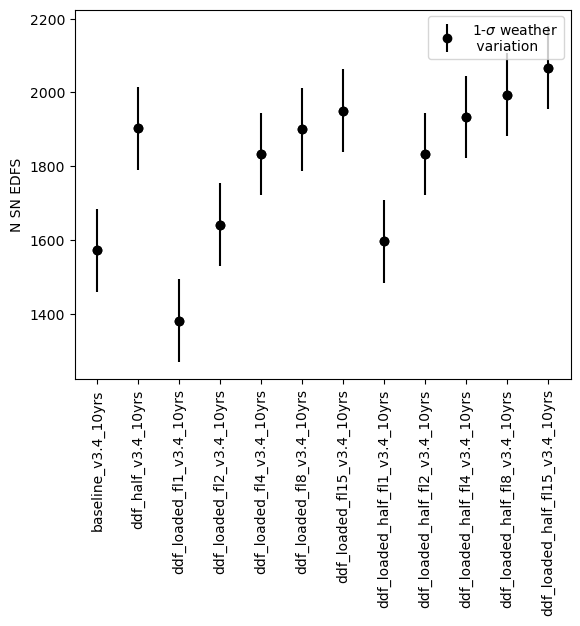

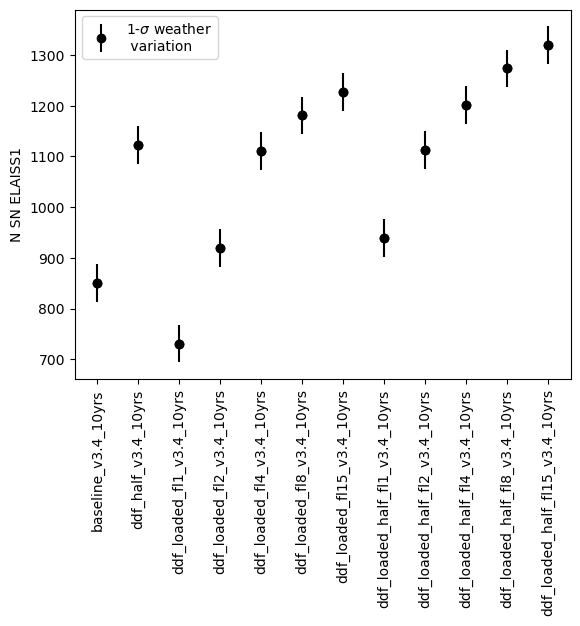

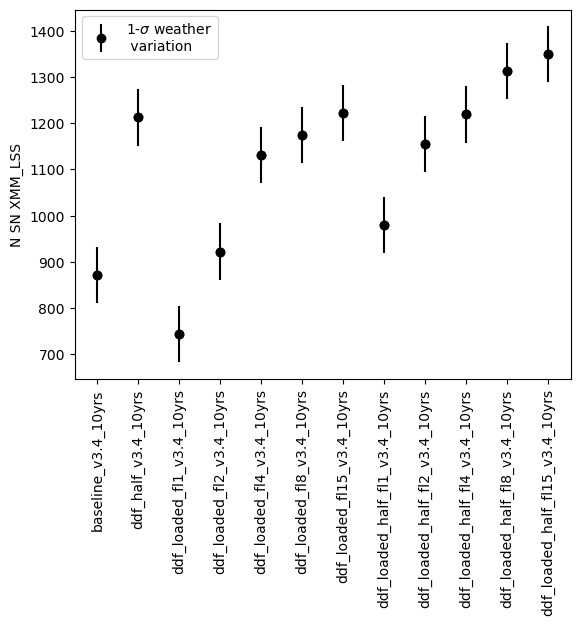

...

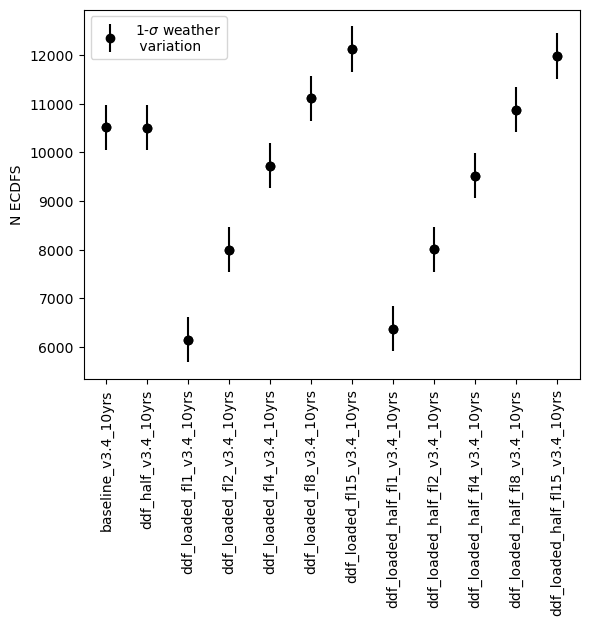

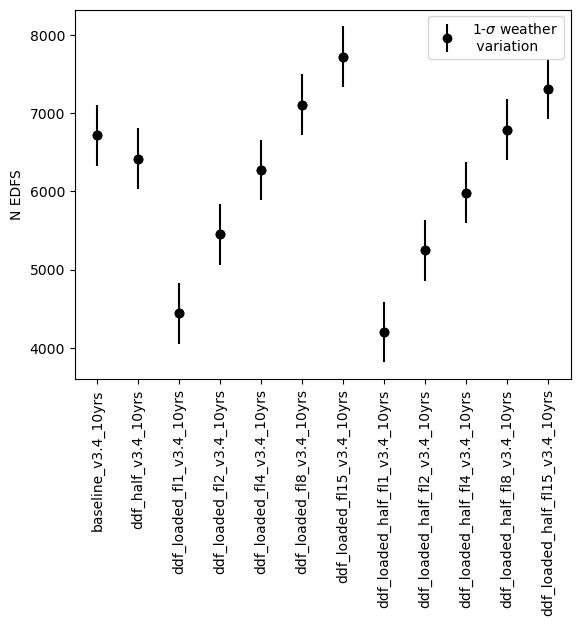

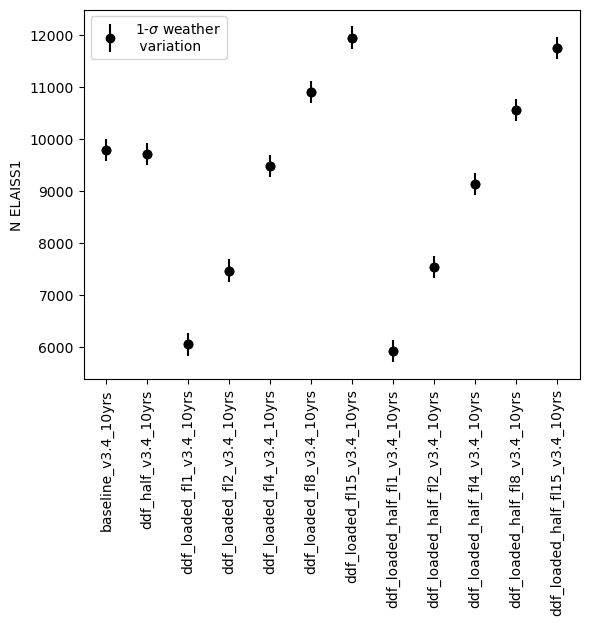

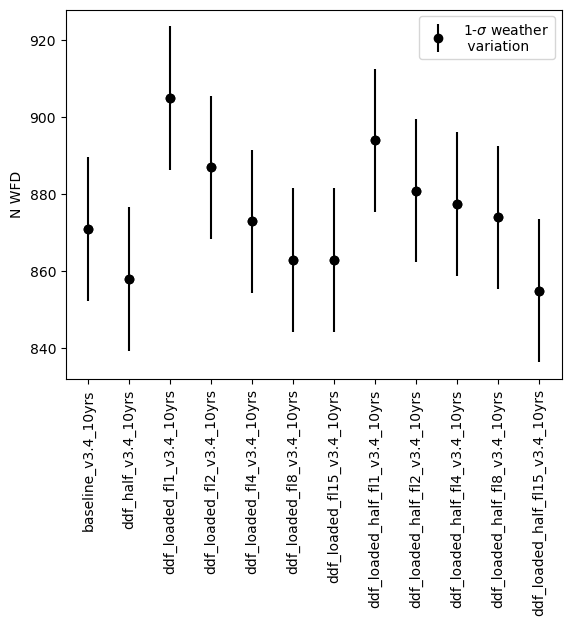

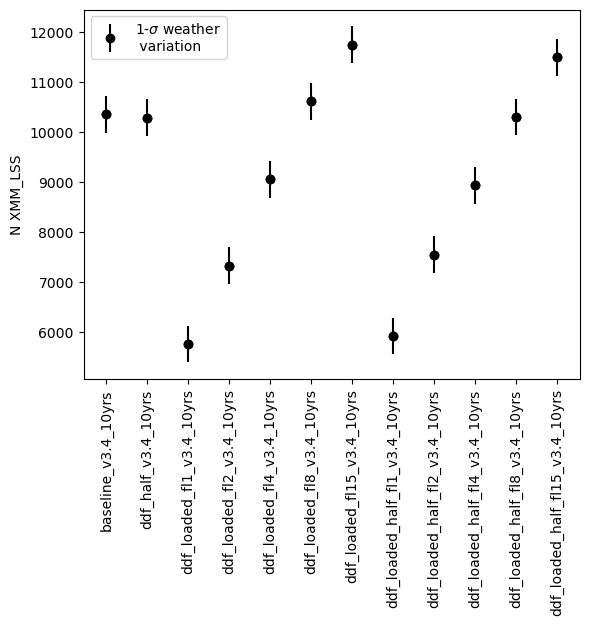

In [21]:
#times = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'short' not in run]
times = ['baseline_v3.4_10yrs',
 'ddf_half_v3.4_10yrs',
 
 'ddf_loaded_fl1_v3.4_10yrs',
 'ddf_loaded_fl2_v3.4_10yrs',
 'ddf_loaded_fl4_v3.4_10yrs',
 'ddf_loaded_fl8_v3.4_10yrs',
 'ddf_loaded_fl15_v3.4_10yrs',
 'ddf_loaded_half_fl1_v3.4_10yrs',
 'ddf_loaded_half_fl2_v3.4_10yrs',
 'ddf_loaded_half_fl4_v3.4_10yrs',
 'ddf_loaded_half_fl8_v3.4_10yrs',
        'ddf_loaded_half_fl15_v3.4_10yrs',]
sub_gaps = ddf_data.reindex(labels=times)



for col in sub_gaps.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_gaps[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_gaps[col].values.size), sub_gaps[col], yerr=std_ddf_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ weather'
                '\n variation', marker='o')
    #if units[col] != '':
    #    label_add = ' (' + units[col]+')'
    ax.set_ylabel(col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])

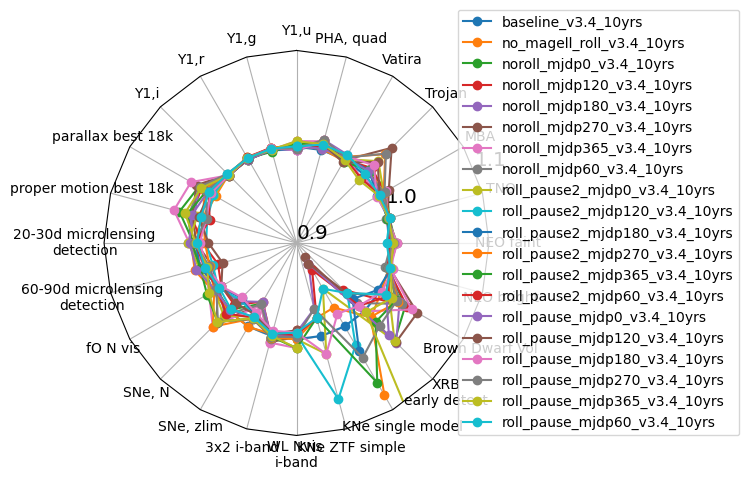

In [22]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'roll' in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

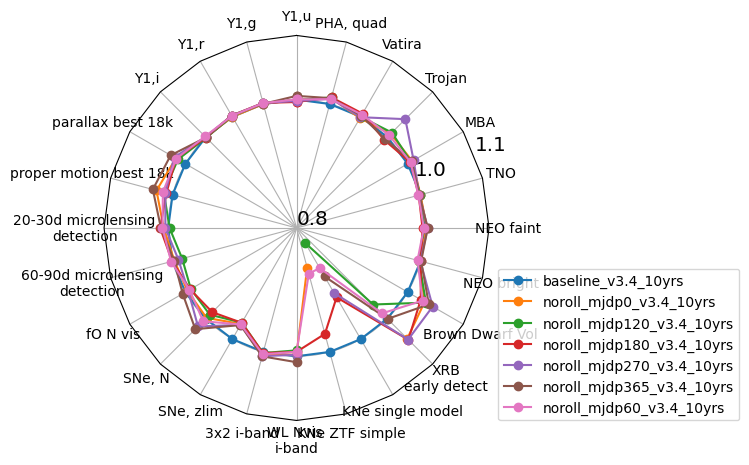

In [23]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'noroll' in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.8, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

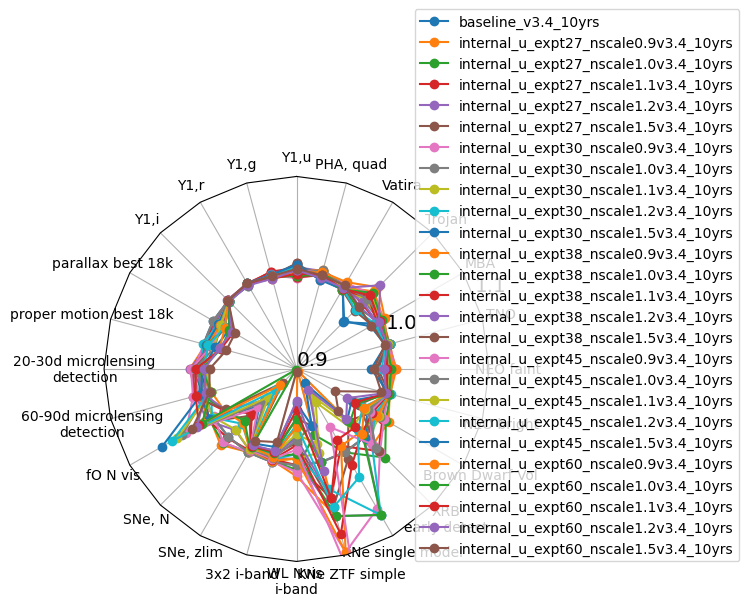

In [24]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'u_exp' in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

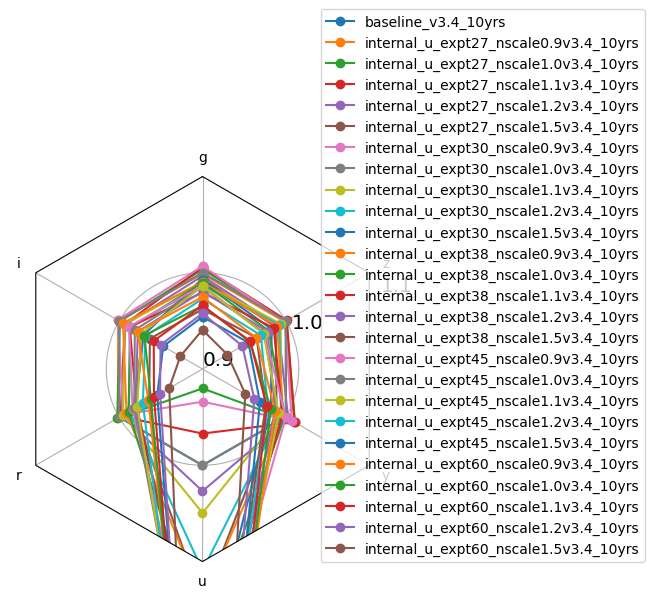

In [25]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'u_exp' in run]

ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.90, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

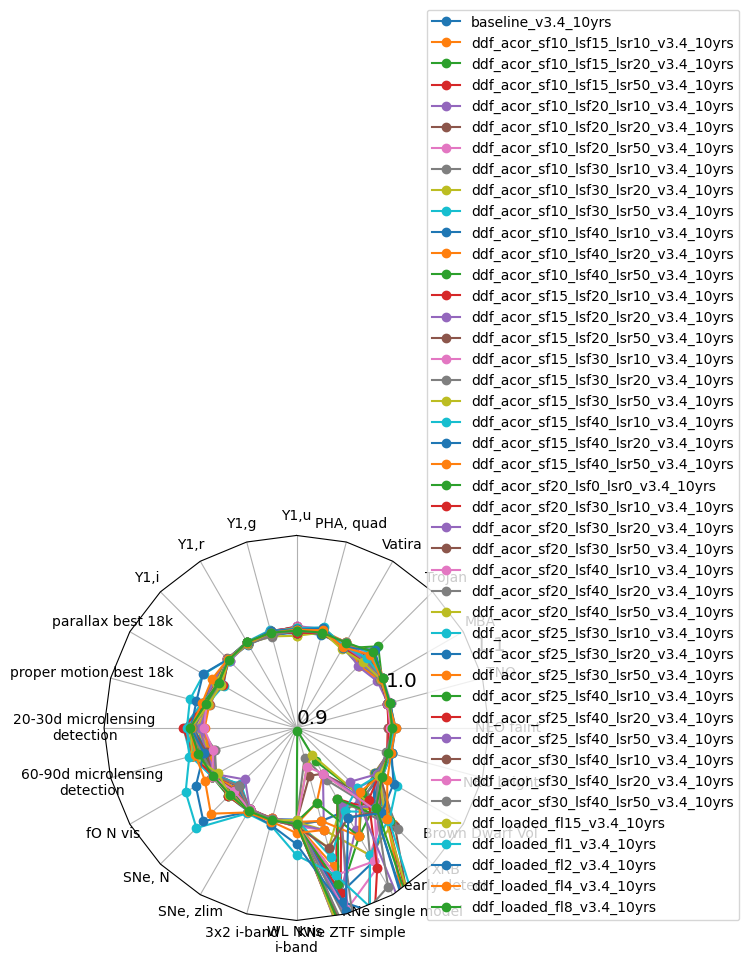

In [26]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'half' not in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

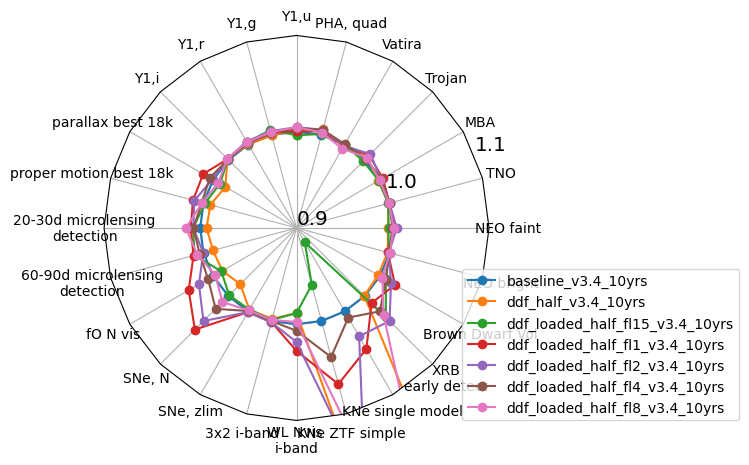

In [27]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'half' in run]


ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

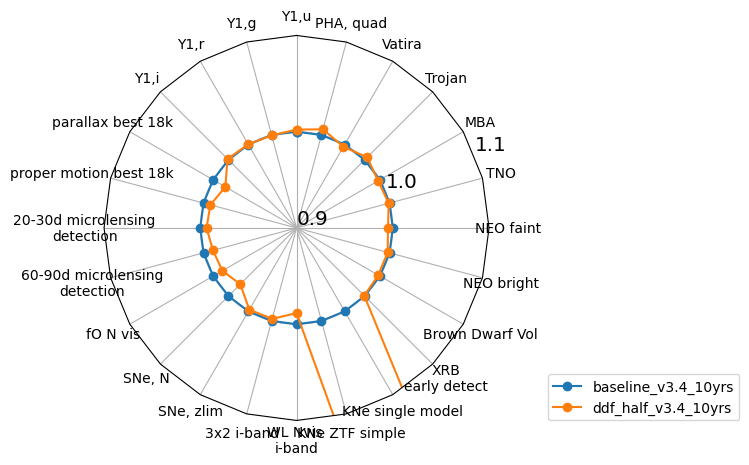

In [28]:
runs = ['baseline_v3.4_10yrs', 'ddf_half_v3.4_10yrs'] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

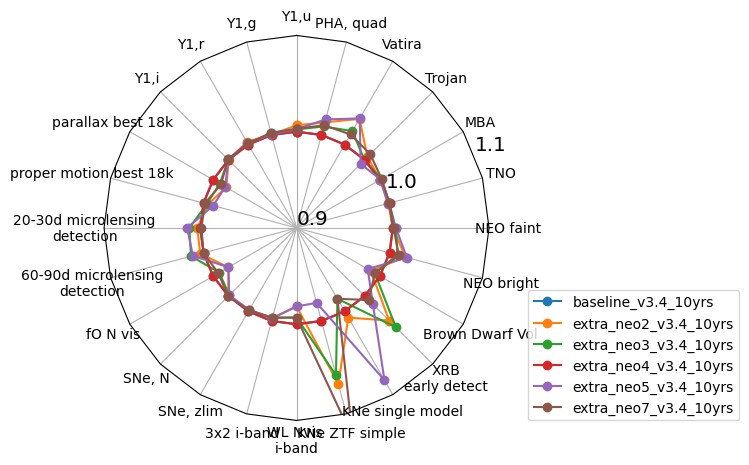

In [29]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'extra_n' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

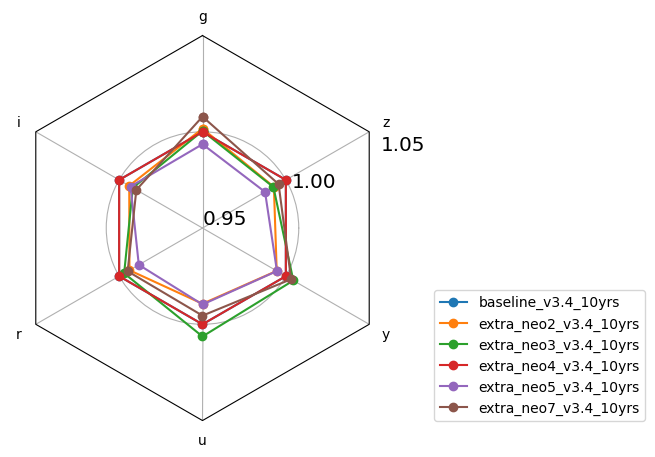

In [30]:
#runs = ['baseline_v3.4_10yrs'] + ['too_100_4v3.4_10yrs'] 

ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

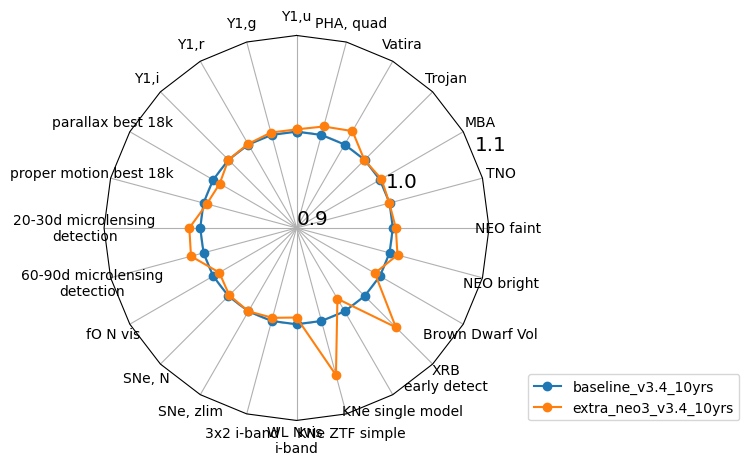

In [31]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'extra_neo3' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

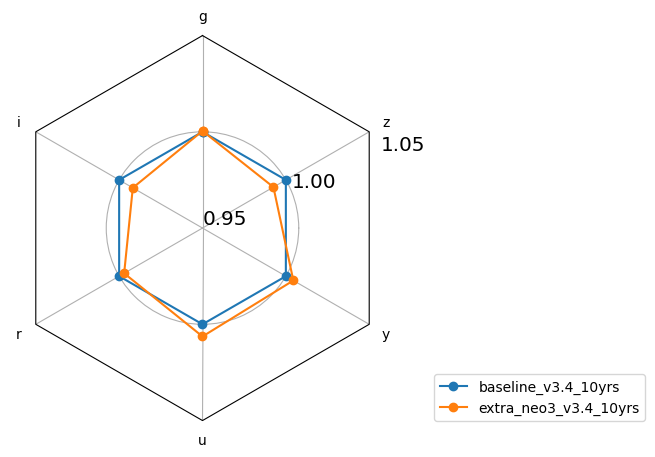

In [32]:
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

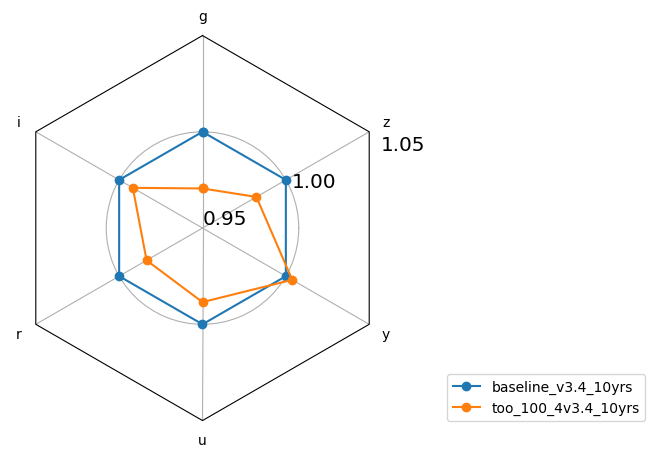

In [33]:
runs = ['baseline_v3.4_10yrs'] + ['too_100_4v3.4_10yrs'] 

ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.65, 0))

In [34]:
mag_data.loc[runs]

,g,i,r,u,y,z
baseline_v3.4_10yrs,26.787451,26.453652,26.938063,25.333755,24.804475,25.752748
too_100_4v3.4_10yrs,26.758018,26.445450,26.921592,25.322232,24.808274,25.735079


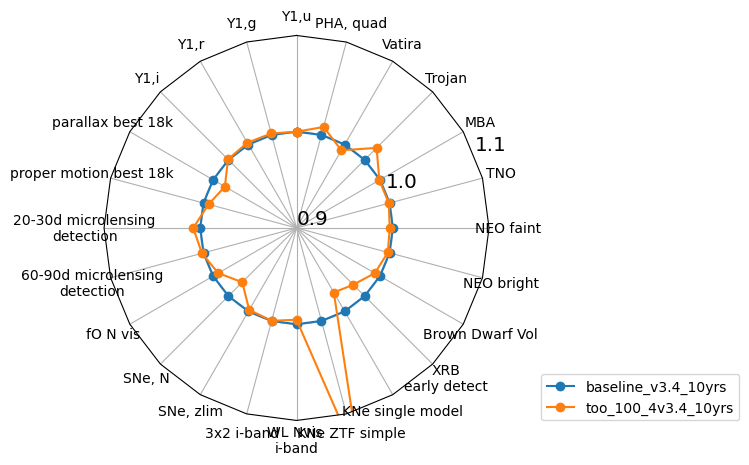

In [35]:
runs = ['baseline_v3.4_10yrs'] + ['too_100_4v3.4_10yrs'] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

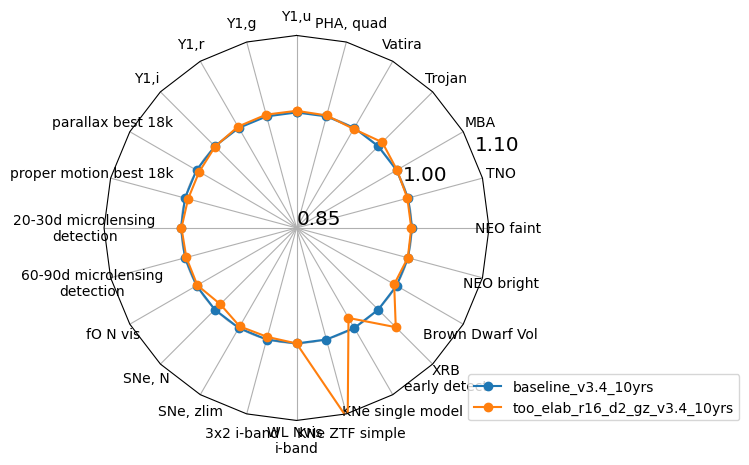

In [36]:
runs = ['baseline_v3.4_10yrs'] + ['too_elab_r16_d2_gz_v3.4_10yrs'] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.85, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

In [37]:
ndata

,"Y1,u","Y1,g","Y1,r","Y1,i",parallax best 18k,proper motion best 18k,20-30d microlensing\ndetection,60-90d microlensing\ndetection,fO N vis,"SNe, N",...,KNe single model,XRB\nearly detect,Brown Dwarf Vol,NEO bright,NEO faint,TNO,MBA,Trojan,Vatira,"PHA, quad"
baseline_v3.4_10yrs,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.0000,1.0000,1.000000,1.000000,...,1.000000,1.000000,1.0000,1.0000,1.000000,1.000000,1.000000,1.000000,1.0000,1.000000
too_elab_r16_d2_gz_v3.4_10yrs,1.002132,1.00237,1.001985,0.999505,0.995954,0.995838,0.9994,0.9982,0.998776,0.990055,...,0.984962,1.032274,0.9964,0.9996,0.998979,0.999035,1.000656,1.007399,0.9984,1.001285


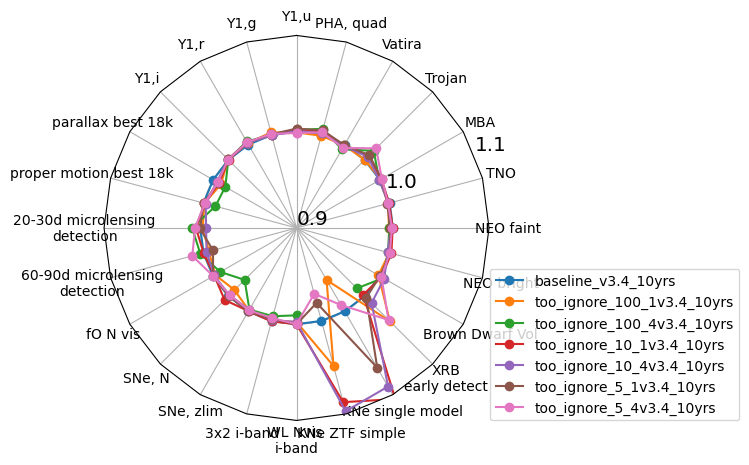

In [38]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too' in run and 'ignore' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

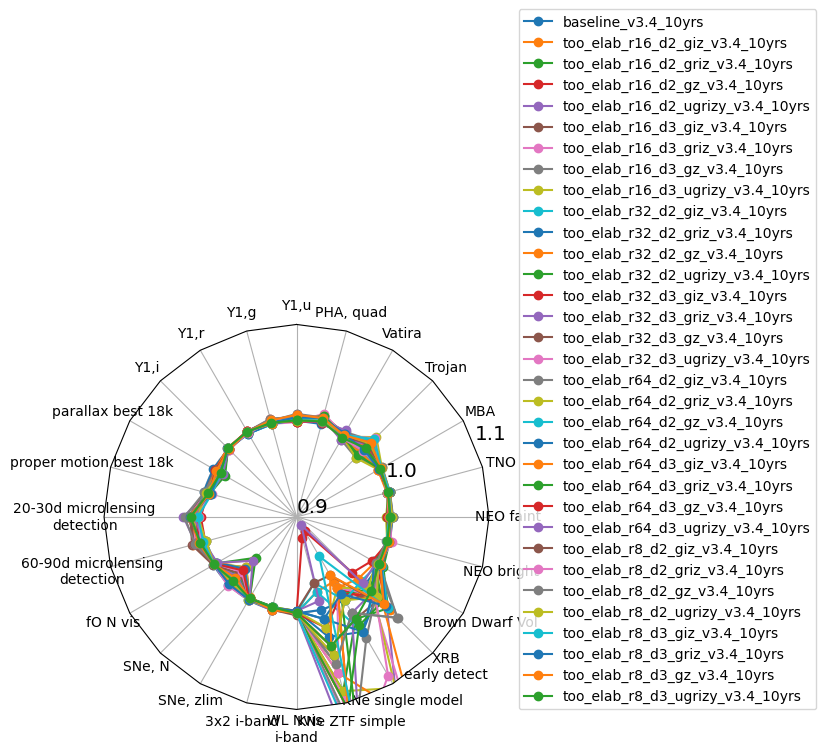

In [39]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_elab_r' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

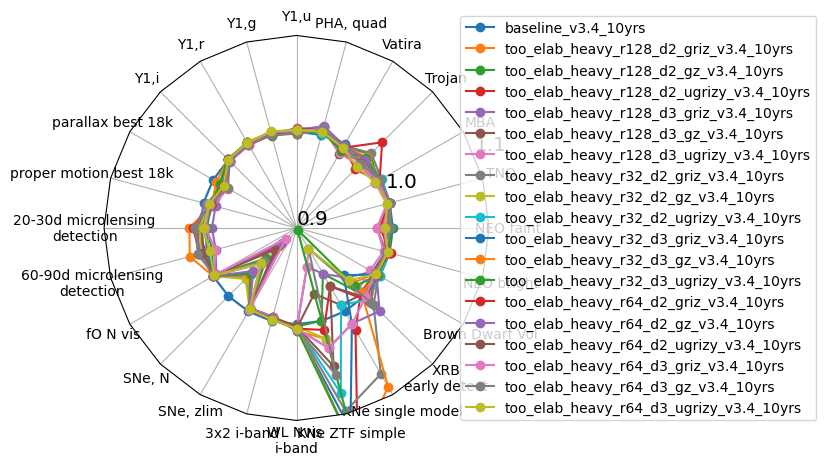

In [40]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'too_elab_heavy' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

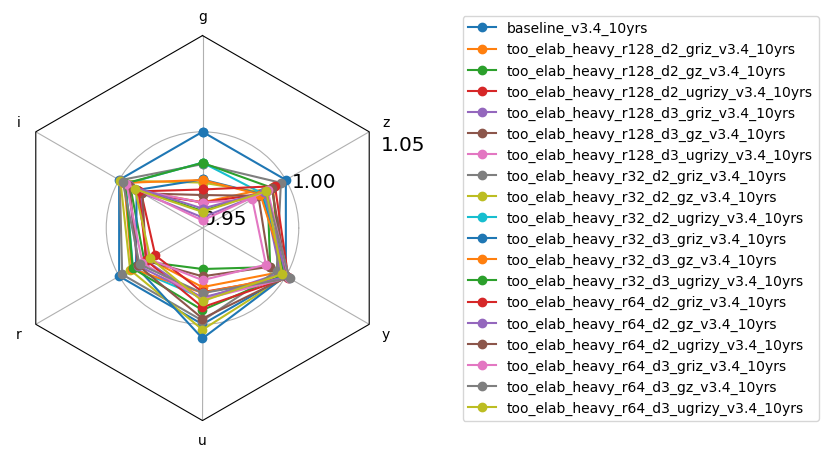

In [41]:
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(2.1, 0))

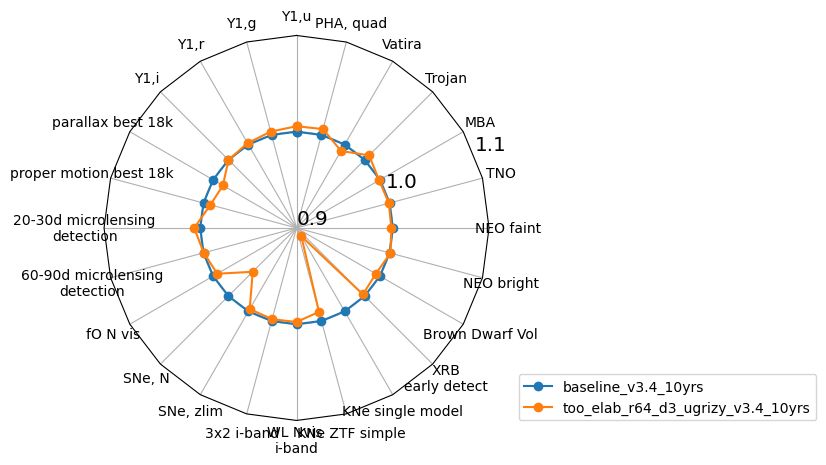

In [52]:
runs = ['baseline_v3.4_10yrs'] + ['too_elab_r64_d3_ugrizy_v3.4_10yrs'] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.85, 0))

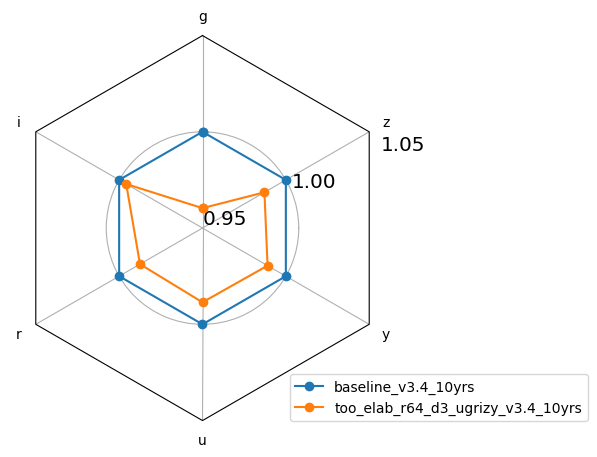

In [55]:
ndata = norm_df(mag_data, runs, cols=mag_data.columns.values.tolist(),
                 mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')#, invert_cols=['u', 'g', 'r', 'i', 'z', 'y'])
fig, ax = radar(ndata, legend=True, rgrids=[0.95, 1.0, 1.05], bbox_to_anchor=(1.5, 0))

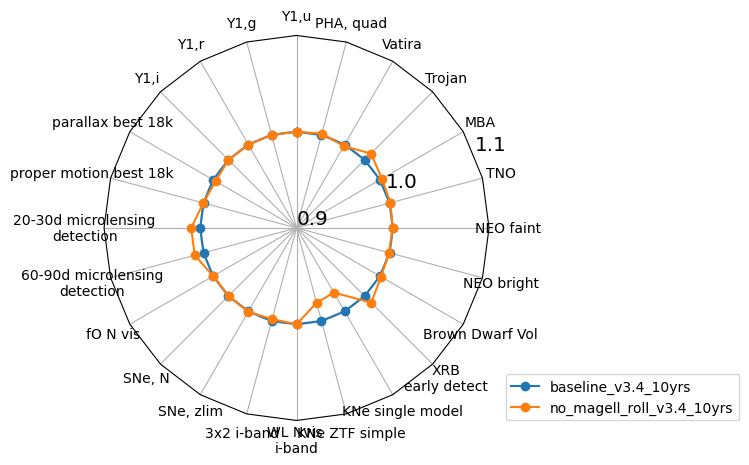

In [42]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'no_magel' in run] 

ndata = norm_df(data, runs, cols=data.columns.values.tolist(),
                invert_cols=invert_cols, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

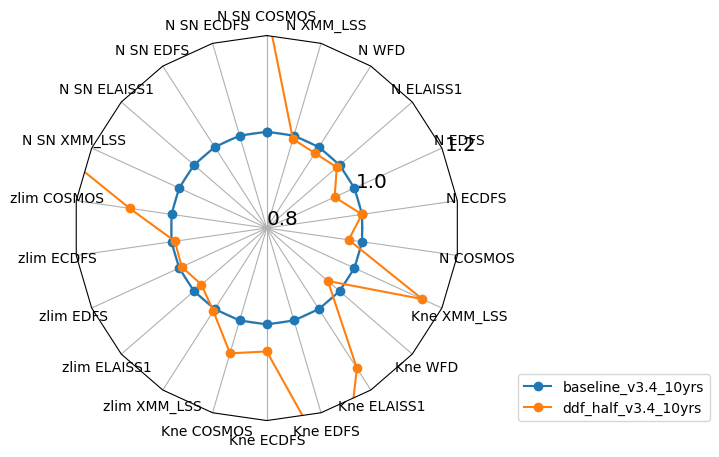

In [43]:
runs = ['baseline_v3.4_10yrs', 'ddf_half_v3.4_10yrs'] 

ndata = norm_df(ddf_data, runs, cols=ddf_data.columns.values.tolist(),
                invert_cols=None, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.8, 1.0, 1.2], bbox_to_anchor=(1.65, 0))

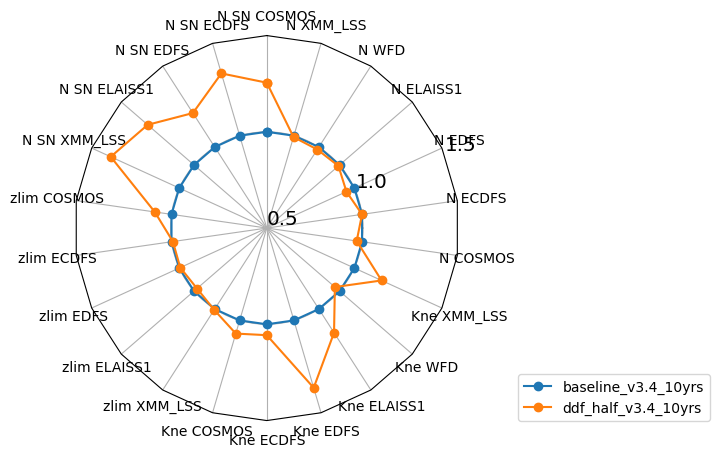

In [44]:
ndata = norm_df(ddf_data, runs, cols=ddf_data.columns.values.tolist(),
                invert_cols=None, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.5, 1.0, 1.5], bbox_to_anchor=(1.65, 0))

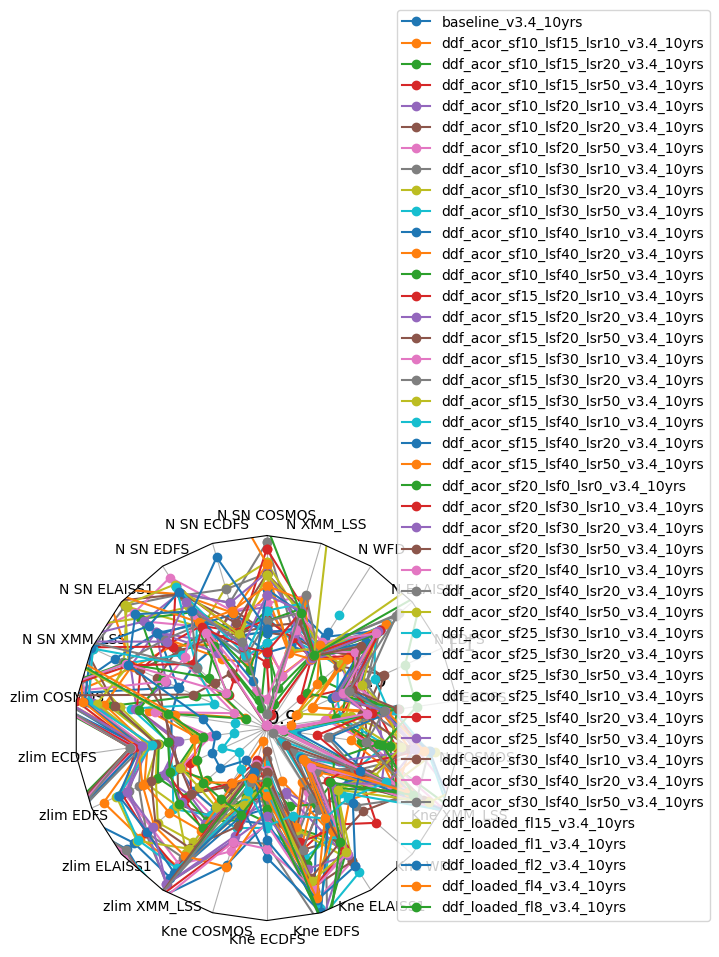

In [45]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'half' not in run]


ndata = norm_df(ddf_data, runs, cols=ddf_data.columns.values.tolist(),
                invert_cols=None, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.9, 1.0, 1.1], bbox_to_anchor=(1.65, 0))

In [46]:
ndata

,N SN COSMOS,N SN ECDFS,N SN EDFS,N SN ELAISS1,N SN XMM_LSS,zlim COSMOS,zlim ECDFS,zlim EDFS,zlim ELAISS1,zlim XMM_LSS,...,Kne EDFS,Kne ELAISS1,Kne WFD,Kne XMM_LSS,N COSMOS,N ECDFS,N EDFS,N ELAISS1,N WFD,N XMM_LSS
baseline_v3.4_10yrs,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
ddf_acor_sf10_lsf15_lsr10_v3.4_10yrs,0.983437,0.970879,0.985166,1.043960,0.924771,1.023637,0.972119,0.997315,0.986655,0.993330,...,0.957770,1.042885,1.013730,1.045045,1.011850,0.965570,1.013690,1.013685,1.001148,0.957923
ddf_acor_sf10_lsf15_lsr20_v3.4_10yrs,0.982949,0.922078,1.018676,1.024470,0.923180,1.006740,0.972682,1.003537,0.982170,0.974256,...,1.008446,1.040936,0.965675,1.128378,0.998750,0.978743,0.990923,0.975899,0.997704,0.943158
ddf_acor_sf10_lsf15_lsr50_v3.4_10yrs,0.967825,0.986686,0.961960,0.952275,0.868163,1.007618,0.966050,0.987384,1.004259,0.967895,...,1.032095,1.019493,1.050343,1.004505,1.006120,0.977364,1.004315,0.946385,0.985075,0.914206
ddf_acor_sf10_lsf20_lsr10_v3.4_10yrs,1.025568,1.026110,1.006627,1.052120,1.055543,1.036552,0.992039,1.020408,1.006086,1.013420,...,0.969595,1.000000,0.894737,1.047297,1.021407,1.016977,0.991815,1.023489,1.004592,0.993052
ddf_acor_sf10_lsf20_lsr20_v3.4_10yrs,0.999464,1.029173,1.003716,1.023605,1.024994,1.008261,0.997992,1.001994,1.021274,1.008433,...,1.032095,1.037037,1.032037,1.063063,1.005469,1.002948,1.031250,1.016136,0.996556,0.998552
ddf_acor_sf10_lsf20_lsr50_v3.4_10yrs,0.987975,0.976272,1.025022,1.069308,0.937065,1.017220,0.958786,0.997922,1.004166,1.006782,...,1.015203,0.978558,0.942792,1.101351,1.007396,0.961242,0.990476,1.005719,1.001148,0.956476
ddf_acor_sf10_lsf30_lsr10_v3.4_10yrs,1.092932,1.036004,1.065211,1.094324,1.098840,1.086823,1.030100,1.057081,1.066366,1.092321,...,1.125000,1.011696,0.935927,1.004505,1.071905,1.024348,0.976637,1.036663,0.986223,1.000676
ddf_acor_sf10_lsf30_lsr20_v3.4_10yrs,1.072366,1.052072,1.024207,1.092726,1.063288,1.067022,1.014776,1.026731,1.049890,1.040908,...,1.010135,1.048733,0.988558,1.042793,1.076931,0.988539,0.935714,1.023999,0.996556,1.021810
ddf_acor_sf10_lsf30_lsr50_v3.4_10yrs,1.014642,1.006446,1.034374,0.997284,0.960421,1.042135,1.003167,1.007424,1.028543,1.007703,...,1.040541,1.031189,0.945080,1.002252,1.024767,0.977459,0.979911,0.998468,0.994259,0.995271


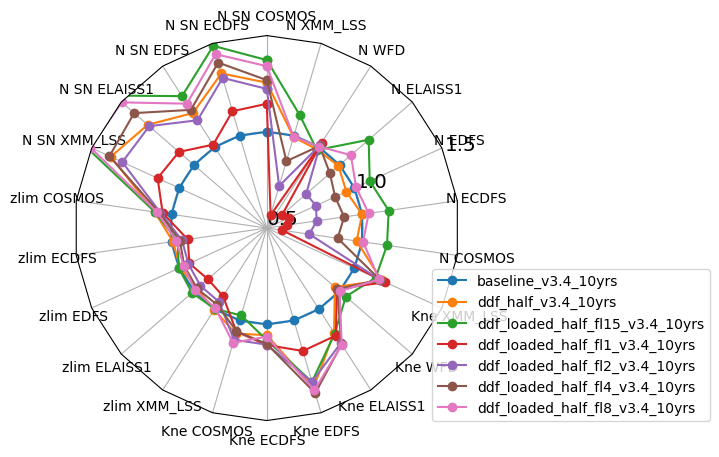

In [47]:
runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'ddf' in run and 'half' in run]


ndata = norm_df(ddf_data, runs, cols=ddf_data.columns.values.tolist(),
                invert_cols=None, mag_cols = mag_cols, norm_run='baseline_v3.4_10yrs')
fig, ax = radar(ndata, legend=True, rgrids=[0.5, 1.0, 1.5], bbox_to_anchor=(1.65, 0))

In [48]:

sub_mag




,g,i,r,u,y,z
retro_baseline_v2.0_10yrs,26.835006,26.308518,26.850968,25.707301,24.842363,25.606168
baseline_v2.0_10yrs,26.733479,26.218659,26.755971,25.818916,24.762720,25.510379
baseline_v2.1_10yrs,26.736248,26.252054,26.781543,25.751969,24.728145,25.486640
baseline_v2.2_10yrs,26.753646,26.290929,26.835430,25.724699,24.782743,25.581317
baseline_v3.0_10yrs,26.688123,26.264600,26.818287,25.668262,24.756955,25.524781
baseline_v3.2_10yrs,26.678103,26.295888,26.807880,25.622696,24.766647,25.586860
baseline_v3.3_10yrs,26.786124,26.451047,26.929058,25.338704,24.805181,25.748060
baseline_v3.4_10yrs,26.787451,26.453652,26.938063,25.333755,24.804475,25.752748


/var/folders/jv/jdhmc2t93njct5cx375mztcr0000gn/T/ipykernel_50796/2717096801.py:8: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "s" (-> marker='s'). The keyword argument will take precedence.
  h0 = ax.errorbar(np.arange(sub_mag[col].values.size), sub_mag[col], yerr=std_mag_dict[col], fmt='s', color='k',


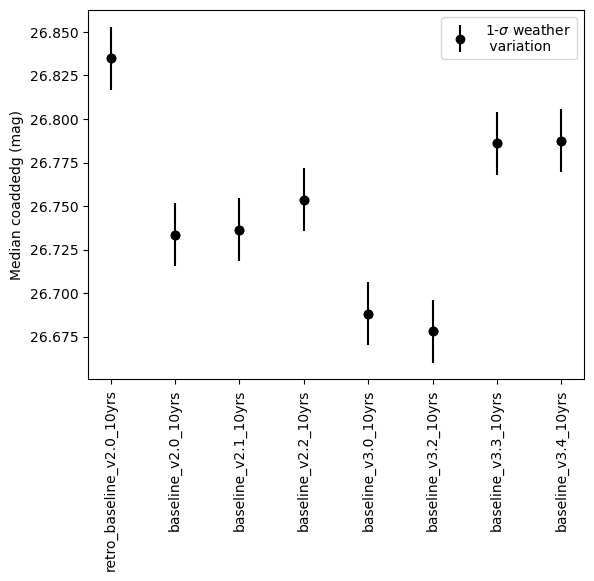

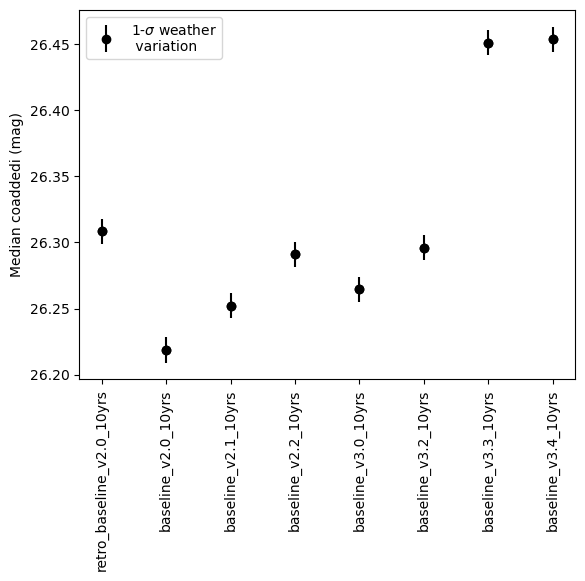

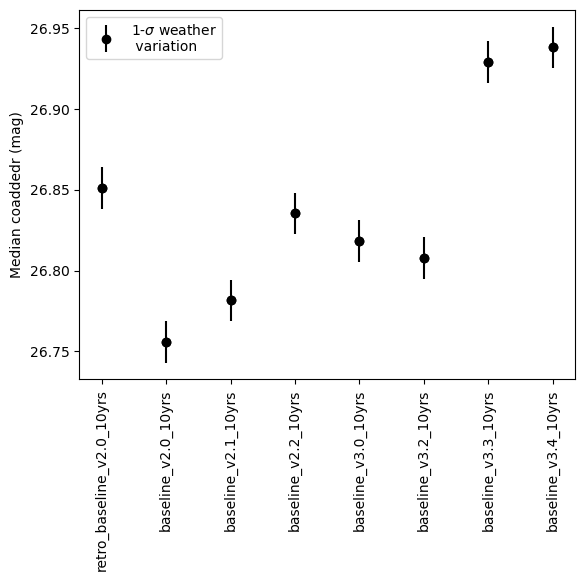

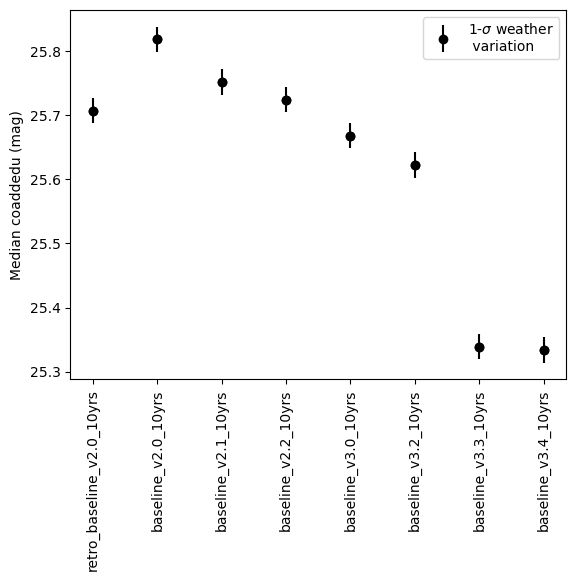

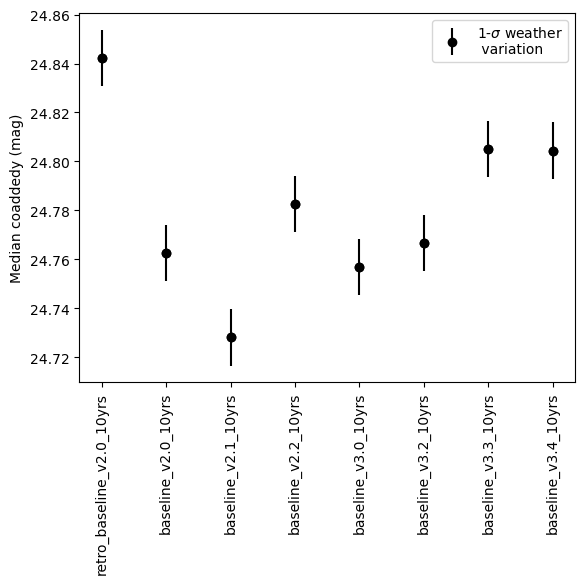

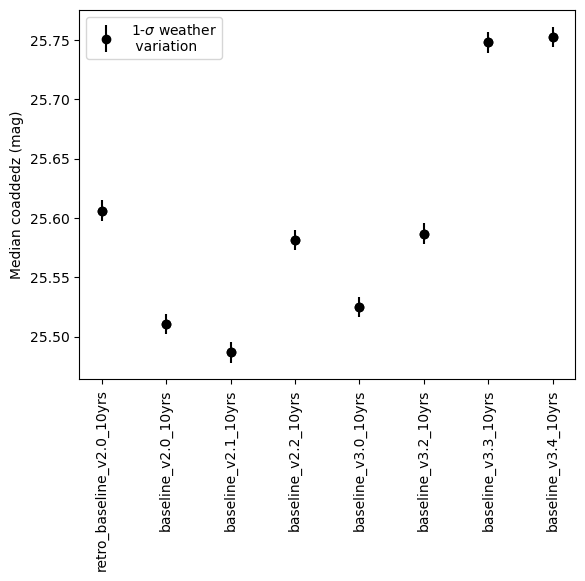

In [49]:
# Rough error bars from weather simulations

#col = data.columns[0]
for col in sub_mag.columns:
    fig, ax = plt.subplots()
    ax.plot(sub_mag[col], 'ko')
    label_add = ''
    h0 = ax.errorbar(np.arange(sub_mag[col].values.size), sub_mag[col], yerr=std_mag_dict[col], fmt='s', color='k',
               label=r'1-$\sigma$ weather'
                '\n variation', marker='o')
    
    label_add = ' (mag)'
    ax.set_ylabel('Median coadded' + col + label_add)
    ax.tick_params(axis='x', labelrotation = 90)
    hh=[h0]
    ax.legend(hh, [H.get_label() for H in hh],
        handler_map={type(h0): HandlerErrorbar(xerr_size=1)})
    if col in invert_cols:
        ax.set_ylim(ax.get_ylim()[::-1])


In [50]:
[col for col in data_loaded.columns if 'MBA' in col and 'Inversion' in col and 'H = 18.0' in col]

['FractionPop Lightcurve Inversion H = 18.000000 LightcurveInversionAsteroid MBA MoObjSlicer']

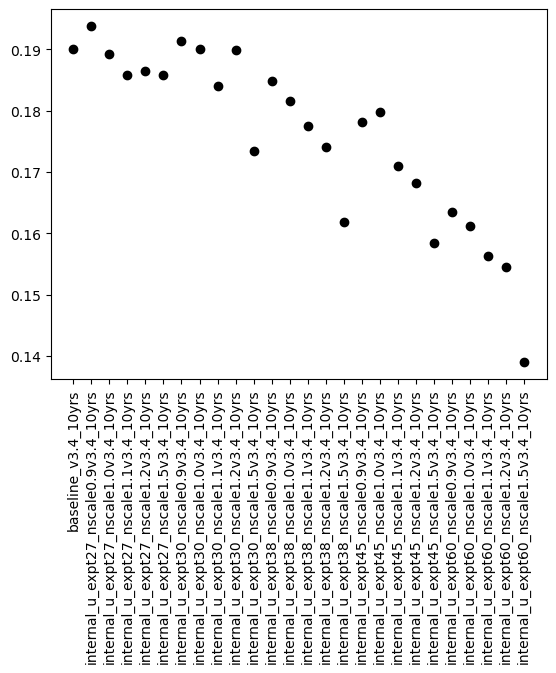

In [51]:

runs = ['baseline_v3.4_10yrs'] + [run for run in data.index if 'u_exp' in run]
fig, ax = plt.subplots()
ax.plot(data_loaded['FractionPop Lightcurve Inversion H = 18.000000 LightcurveInversionAsteroid MBA MoObjSlicer'].loc[runs],
       'ko')
ax.tick_params(axis='x', labelrotation = 90)
